<a href="https://colab.research.google.com/github/lax-17/Fmri-to-image/blob/main/12_ROIs_epoch1000.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Baseline GAN model for assessment

**Module:** Deep Neural Networks and Learning Systems

In this demonstration and notebook, we will develop a baseline model for your assessment task.


---


**Objectives:**

- Develop the baseline convolutional GAN
- Understand the potential modifications to this model to be performed as an assessment

## Setting up the dataset

The dataset is located in a different drive (public). Therefore, we need to add a shortcut to the data directory in our own drive.

**Original dataset**

Open the dataset external drive: [https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb](https://drive.google.com/drive/folders/1DUf3nGNNFk6YjRjQtZPfAY5N105GoGJb) and click in add shortcut.


## Utility functions

The following functions can be used to load the FMRI data from a given subject, load activity from a given region of interest or loading the corresponding image.

In [ ]:
# Core libraries
import os, glob, joblib, shutil
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time

# PyTorch related
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# torchvision related
import torchvision.transforms as transforms
import torchvision.utils as vutils # For saving image grids
from sklearn.decomposition import PCA

import time
import torch.optim as optim
import torch.nn as nn
import torchvision.utils as vutils
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## Loading Data


In [ ]:
root_dir = '/content/drive/MyDrive/Assesment/Dataset'
algonauts_dir = 'algonauts_2023_tutorial_data' # Path to the shortcut in your drive

In [ ]:
algonauts_path = os.path.join(root_dir, algonauts_dir)

In [ ]:
# @title Helper functions
# Loads all the fmri data associated to a given subject
def load_fmri_of_subject( subj, hemisphere, directory = root_dir ):
  subj = subj # Subject
  hemisphere = hemisphere # Which side of the brain
  # Listing directory
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))
  return brain_activity

# Loads the data associated to a specific part of the brain (Some will be empty, it varies by subject)
def load_fmri_region_of_interest( subj, roi, hemisphere, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
    # Define the ROI class based on the selected ROI
  if roi in ["V1v", "V1d", "V2v", "V2d", "V3v", "V3d", "hV4"]:
      roi_class = 'prf-visualrois'
  elif roi in ["EBA", "FBA-1", "FBA-2", "mTL-bodies"]:
      roi_class = 'floc-bodies'
  elif roi in ["OFA", "FFA-1", "FFA-2", "mTL-faces", "aTL-faces"]:
      roi_class = 'floc-faces'
  elif roi in ["OPA", "PPA", "RSC"]:
      roi_class = 'floc-places'
  elif roi in ["OWFA", "VWFA-1", "VWFA-2", "mfs-words", "mTL-words"]:
      roi_class = 'floc-words'
  elif roi in ["early", "midventral", "midlateral", "midparietal", "ventral", "lateral", "parietal"]:
      roi_class = 'streams'

  # Loading the roi masks (To locate the activations of a given region)
  roi_class_dir = os.path.join(data_dir, 'roi_masks',
      hemisphere[0]+'h.'+roi_class+'_challenge_space.npy')
  roi_map_dir = os.path.join(data_dir, 'roi_masks',
      'mapping_'+roi_class+'.npy')
  roi_class_idx = np.load(roi_class_dir)
  roi_map = np.load(roi_map_dir, allow_pickle=True).item()
  roi_mapping = list(roi_map.keys())[list(roi_map.values()).index(roi)]
  challenge_roi = np.asarray(roi_class_idx == roi_mapping, dtype=int)

  # Selection the appropriate data
  fmri_dir = os.path.join(data_dir, 'training_split', 'training_fmri') # Location the brain activation
  # Here we load the data
  if hemisphere == 'left':
    brain_activity = np.load(os.path.join(fmri_dir, 'lh_training_fmri.npy'))
  else:
    brain_activity = np.load(os.path.join(fmri_dir, 'rh_training_fmri.npy'))

  fmri_roi_data = brain_activity[:,np.where(challenge_roi)[0]]

  return fmri_roi_data

# Load a particular image from a subject
def load_image_subject( subj, img, directory = root_dir):
  subj = format(subj, '02')
  data_dir = os.path.join(directory, algonauts_dir )
  data_dir = os.path.join(data_dir, 'subj' + subj) # subj01
  train_img_dir  = os.path.join(data_dir, 'training_split', 'training_images')
  test_img_dir  = os.path.join(data_dir, 'test_split', 'test_images')
  train_img_list = os.listdir(train_img_dir)
  train_img_list.sort()
  test_img_list = os.listdir(test_img_dir)
  test_img_list.sort()

  img_dir = os.path.join(train_img_dir, train_img_list[img])
  train_img = Image.open(img_dir).convert('RGB') # Image library (PIL)
  return train_img

def showImage( ax, image, title = '' ):
  ''' This is a helper function that allows you to show the results of your training '''
  image = (image - torch.min(image))/(torch.max(image)-torch.min(image)) # image 0...1
  ax.imshow(image.permute(1,2,0)) # You need reorganize the dimension (3, H,  W) -> (H, W, 3)
  ax.set_title(title)


## Bulding Dataset


Selected ROIs for PCA (12 ROIs): ['V1v', 'V1d', 'V2v', 'V2d', 'V3v', 'V3d', 'hV4', 'OFA', 'FFA-1', 'PPA', 'OPA', 'RSC']
Computing combined ROI data and PCA from scratch...
Loading fMRI data for subject 1, hemisphere left...


Loading ROIs:   0%|          | 0/12 [00:00<?, ?it/s]

Concatenated fMRI data shape: (9841, 9188)
Voxel counts per included ROI: {'V1v': 710, 'V1d': 828, 'V2v': 632, 'V2d': 692, 'V3v': 567, 'V3d': 669, 'hV4': 531, 'OFA': 432, 'FFA-1': 552, 'PPA': 1311, 'OPA': 1863, 'RSC': 401}
Saved raw combined ROI fMRI data to /content/drive/MyDrive/cdcgan_pca_12rois/fmri_roi_raw.npy
Fitting PCA (256 components)...
PCA fitting complete. Output shape: (9841, 256)
Saving PCA model to /content/drive/MyDrive/cdcgan_pca_12rois/pca_256.joblib
Saving fMRI latent matrix to /content/drive/MyDrive/cdcgan_pca_12rois/fmri_pca_256.npy
Instantiating dataset with preloading...
Preloading 9841 images for subject 1...


Loading images:   0%|          | 0/9841 [00:00<?, ?it/s]

Attempting to stack images into a single tensor...
Successfully stacked images.
Finished preloading 9841 images.
Dataset instantiated.
Setting num_workers to 0 due to preloading.
Dataset and DataLoader created. Number of samples: 9841
Sample batch shapes:
 Image: torch.Size([32, 3, 64, 64])
 fMRI PCA: torch.Size([32, 256])


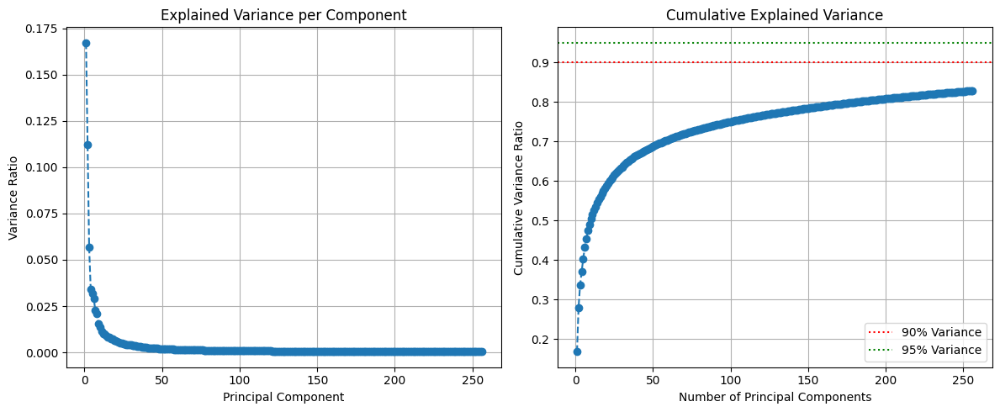

Total variance explained by 256 components: 82.83%


In [ ]:

TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
IMAGE_SIZE = 64
N_COMPONENTS = 256 # Dimension of fMRI after PCA
BATCH_SIZE = 32
NUM_WORKERS = 0


# Chosen based on visual processing hierarchy: Early Visual + Ventral + Dorsal
SELECTED_ROIS = [
    # Early Visual Cortex (Retinotopic)
    'V1v', 'V1d',     # Primary Visual Cortex (ventral/dorsal)
    'V2v', 'V2d',     # Visual Area 2
    'V3v', 'V3d',     # Visual Area 3
    'hV4',            # Human V4 (color/form)
    # Ventral Stream ("What" - Object/Face/Place)
    'OFA',            # Occipital Face Area
    'FFA-1',          # Fusiform Face Area 1 (use FFA-1 or FFA-2 if available)
    'PPA',            # Parahippocampal Place Area
    # Dorsal Stream ("Where/How" - Scene/Spatial)
    'OPA',            # Occipital Place Area
    'RSC',            # Retrosplenial Complex (navigation/scenes)
]
print(f"Selected ROIs for PCA ({len(SELECTED_ROIS)} ROIs): {SELECTED_ROIS}")

img_transform = transforms.Compose([
    transforms.Resize(IMAGE_SIZE),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

PCA_SAVE_DIR = '/content/drive/MyDrive/cdcgan_pca_12rois' # Use a new directory for clarity
PCA_MODEL_PATH = os.path.join(PCA_SAVE_DIR, f'pca_{N_COMPONENTS}.joblib')
FMRI_LATENT_PATH = os.path.join(PCA_SAVE_DIR, f'fmri_pca_{N_COMPONENTS}.npy')
ROI_DATA_RAW_PATH = os.path.join(PCA_SAVE_DIR, 'fmri_roi_raw.npy')

os.makedirs(PCA_SAVE_DIR, exist_ok=True)

fmri_pca_components = None
fmri_roi_data_np = None


print("Computing combined ROI data and PCA from scratch...")
try:
    print(f"Loading fMRI data for subject {TARGET_SUBJECT}, hemisphere {TARGET_HEMISPHERE}...")
    roi_data_list = []
    voxel_counts = {}
    for roi in tqdm(SELECTED_ROIS, desc="Loading ROIs"):
        data = load_fmri_region_of_interest(TARGET_SUBJECT, roi, TARGET_HEMISPHERE, directory=root_dir)
        if data.shape[1] > 0:
            roi_data_list.append(data)
            voxel_counts[roi] = data.shape[1]
        else:
            print(f"  - Skipping ROI '{roi}' (0 voxels found for Subj {TARGET_SUBJECT}, Hemi {TARGET_HEMISPHERE})")

    if not roi_data_list:
         raise ValueError(f"No voxel data found for any specified ROI for subject {TARGET_SUBJECT}, hemisphere {TARGET_HEMISPHERE}.")

    fmri_roi_data_np = np.concatenate(roi_data_list, axis=1)
    print(f"Concatenated fMRI data shape: {fmri_roi_data_np.shape}")
    print("Voxel counts per included ROI:", voxel_counts)
    np.save(ROI_DATA_RAW_PATH, fmri_roi_data_np)
    print(f"Saved raw combined ROI fMRI data to {ROI_DATA_RAW_PATH}")

    # Fit PCA
    print(f"Fitting PCA ({N_COMPONENTS} components)...")
    pca = PCA(n_components=N_COMPONENTS, whiten=True, random_state=42)
    fmri_pca_components = pca.fit_transform(fmri_roi_data_np)
    print(f"PCA fitting complete. Output shape: {fmri_pca_components.shape}")


    print(f"Saving PCA model to {PCA_MODEL_PATH}")
    print(f"Saving fMRI latent matrix to {FMRI_LATENT_PATH}")
    joblib.dump(pca, PCA_MODEL_PATH)
    np.save(FMRI_LATENT_PATH, fmri_pca_components)

except (ValueError, FileNotFoundError, IndexError) as e:
    print(f"Error during data loading or PCA: {e}")
    fmri_pca_components = None

class FMRI_Image_PCA_Dataset(Dataset):
    def __init__(self, subject, fmri_pca_data, transform=None):
        self.subject = subject
        self.fmri_pca = torch.from_numpy(fmri_pca_data).float()
        self.transform = transform
        self.num_samples = fmri_pca_data.shape[0]
        self.images = []

        print(f"Preloading {self.num_samples} images for subject {self.subject}...")

        for idx in tqdm(range(self.num_samples), desc="Loading images"):
            img = load_image_subject(self.subject, idx, directory=root_dir)
            if img is None:
                print(f"Error: Failed to load image {idx}. Using placeholder.")
                img = torch.zeros((3, IMAGE_SIZE, IMAGE_SIZE))
            elif self.transform:
                 img = self.transform(img)
            else:
                 img = transforms.ToTensor()(img)
            self.images.append(img)
        try:
            print("Attempting to stack images into a single tensor...")
            self.images = torch.stack(self.images)
            print("Successfully stacked images.")
        except RuntimeError as e:
            print(f"Warning: Could not stack images into a single tensor (likely memory issue): {e}")
            print("Keeping images as a list of tensors.")

        print(f"Finished preloading {len(self.images)} images.")

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        fmri_vec = self.fmri_pca[idx]
        img = self.images[idx]
        return img, fmri_vec


if fmri_pca_components is not None:
    print("Instantiating dataset with preloading...")
    dataset = FMRI_Image_PCA_Dataset(TARGET_SUBJECT, fmri_pca_components, transform=img_transform)
    print("Dataset instantiated.")
    NUM_WORKERS = 0
    print(f"Setting num_workers to {NUM_WORKERS} due to preloading.")
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True if device.type == 'cuda' else False)
    print(f"Dataset and DataLoader created. Number of samples: {len(dataset)}")
    try:
        img_batch, fmri_batch = next(iter(dataloader))
        print("Sample batch shapes:")
        print(" Image:", img_batch.shape)
        print(" fMRI PCA:", fmri_batch.shape)
    except Exception as e:
        print(f"Error getting batch from DataLoader: {e}")

else:
    print("Dataset/DataLoader creation skipped due to PCA errors.")
    dataloader = None


if 'pca' in locals() and fmri_pca_components is not None:
    explained_variance = pca.explained_variance_ratio_
    cumulative_explained_variance = np.cumsum(explained_variance)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, N_COMPONENTS + 1), explained_variance, marker='o', linestyle='--')
    plt.title('Explained Variance per Component')
    plt.xlabel('Principal Component')
    plt.ylabel('Variance Ratio')
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(range(1, N_COMPONENTS + 1), cumulative_explained_variance, marker='o', linestyle='--')
    plt.title('Cumulative Explained Variance')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Variance Ratio')
    plt.axhline(y=0.9, color='r', linestyle=':', label='90% Variance')
    plt.axhline(y=0.95, color='g', linestyle=':', label='95% Variance')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    print(f"Total variance explained by {N_COMPONENTS} components: {cumulative_explained_variance[-1]*100:.2f}%")

else:
    print("PCA object not available for plotting explained variance.")

## Models cDCGAN

In [ ]:
nz = 100
fMRI_dim = N_COMPONENTS
ngf = 64
ndf = 64
nc = 3
embedding_dim = 128


def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.fMRI_embed = nn.Linear(fMRI_dim, embedding_dim)
        combined_input_dim = nz + embedding_dim

        self.main = nn.Sequential(
            # input is Z + embedded fMRI, going into a convolution
            nn.ConvTranspose2d(combined_input_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, noise, fmri_condition):
        fmri_embedded = self.fMRI_embed(fmri_condition)
        gen_input = torch.cat((noise, fmri_embedded), 1)
        gen_input_reshaped = gen_input.unsqueeze(-1).unsqueeze(-1)
        # Generate image
        return self.main(gen_input_reshaped)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.fMRI_embed = nn.Sequential(
            nn.Linear(fMRI_dim, embedding_dim),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            # Input to next layer: (ndf + embedding_dim) x 32 x 32
            nn.Conv2d(ndf + embedding_dim, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: probability (1x1x1)
        )

    def forward(self, image, fmri_condition):
        img_features = self.main[0](image) # (batch, ndf, 32, 32)
        img_features = self.main[1](img_features)

        fmri_embedded = self.fMRI_embed(fmri_condition)
        # Reshape and tile embedding: (batch, embedding_dim, 1, 1) -> (batch, embedding_dim, 32, 32)
        fmri_spatial = fmri_embedded.unsqueeze(-1).unsqueeze(-1).expand(-1, -1, 32, 32)

        # Concatenate along channel dimension
        combined_features = torch.cat((img_features, fmri_spatial), 1) # (batch, ndf + embedding_dim, 32, 32)

        output = combined_features
        for layer in self.main[2:]:
             output = layer(output)

        return output.view(-1, 1).squeeze(1)

netG = Generator().to(device)
netD = Discriminator().to(device)

netG.apply(weights_init)
netD.apply(weights_init)

# Print the models
print("--- Generator ---")
print(netG)
print("\n--- Discriminator ---")
print(netD)

--- Generator ---
Generator(
  (fMRI_embed): Linear(in_features=256, out_features=128, bias=True)
  (main): Sequential(
    (0): ConvTranspose2d(228, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3,

## Training setup

In [ ]:
criterion = nn.BCELoss() # Binary Cross Entropy for GANs

fixed_noise = torch.randn(BATCH_SIZE, nz, device=device)

if dataloader:
    fixed_real_batch, fixed_fmri_batch = next(iter(dataloader))
    fixed_fmri_condition = fixed_fmri_batch[:BATCH_SIZE].to(device)
    print(f"Using fixed fMRI conditions of shape: {fixed_fmri_condition.shape} for previews")
    real_images_for_preview = fixed_real_batch[:BATCH_SIZE]
    vutils.save_image(real_images_for_preview * 0.5 + 0.5,
                      os.path.join(PCA_SAVE_DIR, "real_samples_for_preview.png"),
                      normalize=False, padding=2)
    print("Saved real image samples corresponding to fixed conditions for comparison.")
else:
    print("Warning: Dataloader not available, cannot set fixed conditions for preview.")
    fixed_fmri_condition = None
    real_images_for_preview = None

real_label = 1.
fake_label = 0.
lr = 0.0002
beta1 = 0.5
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

img_list = []
G_losses = []
D_losses = []

print("Training setup complete.")

Using fixed fMRI conditions of shape: torch.Size([32, 256]) for previews
Saved real image samples corresponding to fixed conditions for comparison.
Training setup complete.


In [ ]:
num_epochs = 50
preview_every = 1
checkpoint_every = 10

PREVIEW_DIR_CDCGAN = '/content/drive/MyDrive/cdcgan_previews'
CHECKPOINT_DIR_CDCGAN = '/content/drive/MyDrive/cdcgan_checkpoints'
os.makedirs(PREVIEW_DIR_CDCGAN, exist_ok=True)
os.makedirs(CHECKPOINT_DIR_CDCGAN, exist_ok=True)

print("Starting cDCGAN Training Loop...")
iters = 0

if dataloader is None or fixed_fmri_condition is None:
    print("Error: Dataloader or fixed_fmri_condition not initialized. Cannot train.")
else:
    start_time = time.time()
    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        netG.train()
        netD.train()
        progress_bar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch+1}/{num_epochs}")

        for i, data in progress_bar:
            netD.zero_grad()
            real_cpu = data[0].to(device)
            fmri_cond = data[1].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

            output = netD(real_cpu, fmri_cond)
            errD_real = criterion(output, label)
            errD_real.backward()
            D_x = output.mean().item()

            noise = torch.randn(b_size, nz, device=device)
            fake = netG(noise, fmri_cond)
            label.fill_(fake_label)

            output = netD(fake.detach(), fmri_cond)
            errD_fake = criterion(output, label)
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            netG.zero_grad()
            label.fill_(real_label)
            output = netD(fake, fmri_cond)
            errG = criterion(output, label)
            errG.backward()
            D_G_z2 = output.mean().item()
            optimizerG.step()

            if i % 50 == 0:
                progress_bar.set_postfix({
                    'Loss_D': f'{errD.item():.4f}',
                    'Loss_G': f'{errG.item():.4f}',
                    'D(x)': f'{D_x:.4f}',
                    'D(G(z))': f'{D_G_z1:.4f}/{D_G_z2:.4f}'
                })


            G_losses.append(errG.item())
            D_losses.append(errD.item())
            iters += 1

        # --- End of Epoch ---
        epoch_time = time.time() - epoch_start_time
        print(f'Epoch [{epoch+1}/{num_epochs}] finished in {epoch_time:.2f}s. Last batch Losses -> D: {errD.item():.4f}, G: {errG.item():.4f}')

        # Checkpoint saving
        if (epoch + 1) % checkpoint_every == 0 or (epoch + 1) == num_epochs:
            ckpt_path_g = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netG_epoch_{epoch+1}.pth')
            ckpt_path_d = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netD_epoch_{epoch+1}.pth')
            torch.save(netG.state_dict(), ckpt_path_g)
            torch.save(netD.state_dict(), ckpt_path_d)
            print(f'💾 Checkpoints saved for epoch {epoch+1}')

        # Preview generation
        if (epoch + 1) % preview_every == 0 or (epoch + 1) == num_epochs:
             netG.eval() # Set generator to evaluation mode for preview
             with torch.no_grad():
                 fake_preview = netG(fixed_noise, fixed_fmri_condition).detach().cpu()
             img_grid = vutils.make_grid(fake_preview, padding=2, normalize=True, nrow=8) # Creates grid, normalizes to [0,1]
             img_list.append(img_grid)

             preview_save_path = os.path.join(PREVIEW_DIR_CDCGAN, f'preview_epoch_{epoch+1}.png')
             vutils.save_image(img_grid, preview_save_path)
             print(f'🖼️ Preview grid saved for epoch {epoch+1}')
             netG.train() # Switch back to train mode


    total_time = time.time() - start_time
    print(f"--- Training Finished ({num_epochs} epochs) in {total_time:.2f}s ---")

    # Save final models
    torch.save(netG.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth'))
    torch.save(netD.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netD_final.pth'))
    print("✅ Final models saved.")

    # Save loss curves
    LOSS_CURVE_G_PATH = os.path.join(CHECKPOINT_DIR_CDCGAN, 'g_losses.npy')
    LOSS_CURVE_D_PATH = os.path.join(CHECKPOINT_DIR_CDCGAN, 'd_losses.npy')
    np.save(LOSS_CURVE_G_PATH, np.array(G_losses))
    np.save(LOSS_CURVE_D_PATH, np.array(D_losses))
    print(f'📉 Loss curves saved.')

Starting cDCGAN Training Loop...


Epoch 1/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [1/50] finished in 17.49s. Last batch Losses -> D: 0.5293, G: 3.8802
🖼️ Preview grid saved for epoch 1


Epoch 2/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [2/50] finished in 16.14s. Last batch Losses -> D: 0.8097, G: 3.6700
🖼️ Preview grid saved for epoch 2


Epoch 3/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [3/50] finished in 16.36s. Last batch Losses -> D: 1.1049, G: 1.3520
🖼️ Preview grid saved for epoch 3


Epoch 4/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [4/50] finished in 16.58s. Last batch Losses -> D: 1.2481, G: 1.2382
🖼️ Preview grid saved for epoch 4


Epoch 5/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [5/50] finished in 16.83s. Last batch Losses -> D: 1.5506, G: 1.6080
🖼️ Preview grid saved for epoch 5


Epoch 6/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [6/50] finished in 17.11s. Last batch Losses -> D: 0.9057, G: 1.6655
🖼️ Preview grid saved for epoch 6


Epoch 7/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [7/50] finished in 17.38s. Last batch Losses -> D: 1.3500, G: 1.8300
🖼️ Preview grid saved for epoch 7


Epoch 8/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [8/50] finished in 17.40s. Last batch Losses -> D: 1.4546, G: 1.1126
🖼️ Preview grid saved for epoch 8


Epoch 9/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [9/50] finished in 17.28s. Last batch Losses -> D: 1.5209, G: 0.8966
🖼️ Preview grid saved for epoch 9


Epoch 10/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [10/50] finished in 17.22s. Last batch Losses -> D: 1.4227, G: 1.5328
💾 Checkpoints saved for epoch 10
🖼️ Preview grid saved for epoch 10


Epoch 11/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [11/50] finished in 17.24s. Last batch Losses -> D: 0.9019, G: 1.2813
🖼️ Preview grid saved for epoch 11


Epoch 12/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [12/50] finished in 17.30s. Last batch Losses -> D: 1.0902, G: 0.9938
🖼️ Preview grid saved for epoch 12


Epoch 13/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [13/50] finished in 17.31s. Last batch Losses -> D: 2.1368, G: 0.8998
🖼️ Preview grid saved for epoch 13


Epoch 14/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [14/50] finished in 17.29s. Last batch Losses -> D: 1.1559, G: 3.3847
🖼️ Preview grid saved for epoch 14


Epoch 15/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [15/50] finished in 17.31s. Last batch Losses -> D: 1.5591, G: 2.6115
🖼️ Preview grid saved for epoch 15


Epoch 16/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [16/50] finished in 17.30s. Last batch Losses -> D: 0.9470, G: 0.9271
🖼️ Preview grid saved for epoch 16


Epoch 17/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [17/50] finished in 17.28s. Last batch Losses -> D: 1.4981, G: 3.9462
🖼️ Preview grid saved for epoch 17


Epoch 18/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [18/50] finished in 17.27s. Last batch Losses -> D: 1.7474, G: 0.9179
🖼️ Preview grid saved for epoch 18


Epoch 19/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [19/50] finished in 17.33s. Last batch Losses -> D: 1.0470, G: 2.2739
🖼️ Preview grid saved for epoch 19


Epoch 20/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [20/50] finished in 17.29s. Last batch Losses -> D: 0.8078, G: 1.4538
💾 Checkpoints saved for epoch 20
🖼️ Preview grid saved for epoch 20


Epoch 21/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [21/50] finished in 17.28s. Last batch Losses -> D: 1.8721, G: 0.3303
🖼️ Preview grid saved for epoch 21


Epoch 22/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [22/50] finished in 17.27s. Last batch Losses -> D: 0.8143, G: 1.3863
🖼️ Preview grid saved for epoch 22


Epoch 23/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [23/50] finished in 17.27s. Last batch Losses -> D: 1.1748, G: 1.9480
🖼️ Preview grid saved for epoch 23


Epoch 24/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [24/50] finished in 17.27s. Last batch Losses -> D: 0.3676, G: 2.5738
🖼️ Preview grid saved for epoch 24


Epoch 25/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [25/50] finished in 17.26s. Last batch Losses -> D: 0.8651, G: 1.6734
🖼️ Preview grid saved for epoch 25


Epoch 26/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [26/50] finished in 17.27s. Last batch Losses -> D: 0.9080, G: 2.0280
🖼️ Preview grid saved for epoch 26


Epoch 27/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [27/50] finished in 17.27s. Last batch Losses -> D: 0.3814, G: 3.1738
🖼️ Preview grid saved for epoch 27


Epoch 28/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [28/50] finished in 17.28s. Last batch Losses -> D: 0.2166, G: 3.6994
🖼️ Preview grid saved for epoch 28


Epoch 29/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [29/50] finished in 17.27s. Last batch Losses -> D: 0.7663, G: 4.7947
🖼️ Preview grid saved for epoch 29


Epoch 30/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [30/50] finished in 17.27s. Last batch Losses -> D: 1.0326, G: 0.2936
💾 Checkpoints saved for epoch 30
🖼️ Preview grid saved for epoch 30


Epoch 31/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [31/50] finished in 17.27s. Last batch Losses -> D: 0.5106, G: 2.3157
🖼️ Preview grid saved for epoch 31


Epoch 32/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [32/50] finished in 17.26s. Last batch Losses -> D: 1.2205, G: 0.5069
🖼️ Preview grid saved for epoch 32


Epoch 33/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [33/50] finished in 17.26s. Last batch Losses -> D: 3.1634, G: 5.2523
🖼️ Preview grid saved for epoch 33


Epoch 34/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [34/50] finished in 17.26s. Last batch Losses -> D: 0.6466, G: 3.5061
🖼️ Preview grid saved for epoch 34


Epoch 35/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [35/50] finished in 17.26s. Last batch Losses -> D: 0.3627, G: 3.1445
🖼️ Preview grid saved for epoch 35


Epoch 36/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [36/50] finished in 17.25s. Last batch Losses -> D: 0.7244, G: 3.8600
🖼️ Preview grid saved for epoch 36


Epoch 37/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [37/50] finished in 17.26s. Last batch Losses -> D: 1.2284, G: 4.9416
🖼️ Preview grid saved for epoch 37


Epoch 38/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [38/50] finished in 17.26s. Last batch Losses -> D: 2.3007, G: 7.2671
🖼️ Preview grid saved for epoch 38


Epoch 39/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [39/50] finished in 17.27s. Last batch Losses -> D: 0.1001, G: 4.6533
🖼️ Preview grid saved for epoch 39


Epoch 40/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [40/50] finished in 17.26s. Last batch Losses -> D: 2.1738, G: 1.4104
💾 Checkpoints saved for epoch 40
🖼️ Preview grid saved for epoch 40


Epoch 41/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [41/50] finished in 17.27s. Last batch Losses -> D: 1.2618, G: 1.5489
🖼️ Preview grid saved for epoch 41


Epoch 42/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [42/50] finished in 17.27s. Last batch Losses -> D: 0.8266, G: 2.4842
🖼️ Preview grid saved for epoch 42


Epoch 43/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [43/50] finished in 17.26s. Last batch Losses -> D: 1.0103, G: 1.3219
🖼️ Preview grid saved for epoch 43


Epoch 44/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [44/50] finished in 17.28s. Last batch Losses -> D: 3.1191, G: 0.1991
🖼️ Preview grid saved for epoch 44


Epoch 45/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [45/50] finished in 17.27s. Last batch Losses -> D: 0.3564, G: 2.5713
🖼️ Preview grid saved for epoch 45


Epoch 46/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [46/50] finished in 17.27s. Last batch Losses -> D: 1.3621, G: 6.1986
🖼️ Preview grid saved for epoch 46


Epoch 47/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [47/50] finished in 17.28s. Last batch Losses -> D: 0.6041, G: 2.7662
🖼️ Preview grid saved for epoch 47


Epoch 48/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [48/50] finished in 17.29s. Last batch Losses -> D: 0.8291, G: 4.2245
🖼️ Preview grid saved for epoch 48


Epoch 49/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [49/50] finished in 17.30s. Last batch Losses -> D: 1.5382, G: 4.6926
🖼️ Preview grid saved for epoch 49


Epoch 50/50:   0%|          | 0/308 [00:00<?, ?it/s]

Epoch [50/50] finished in 17.30s. Last batch Losses -> D: 1.3522, G: 0.4049
💾 Checkpoints saved for epoch 50
🖼️ Preview grid saved for epoch 50
--- Training Finished (50 epochs) in 863.50s ---
✅ Final models saved.
📉 Loss curves saved.


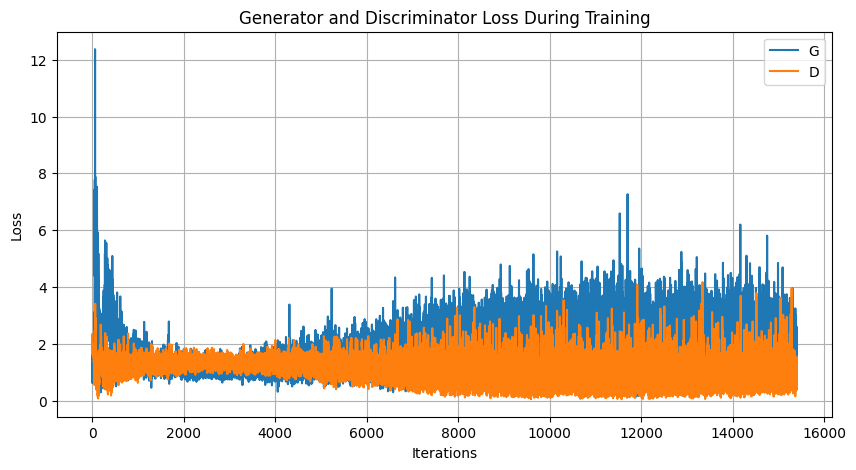

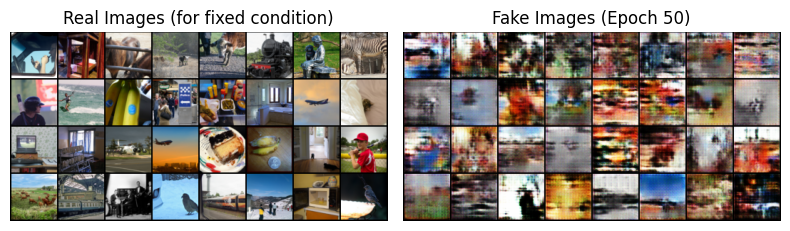

Creating GIF (saving to /content/drive/MyDrive/cdcgan_checkpoints/training_progress.gif)...
GIF creation complete.


In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.savefig(os.path.join(CHECKPOINT_DIR_CDCGAN, 'loss_curve.png'))
plt.show()

if real_images_for_preview is not None and len(img_list) > 0:
    plt.figure(figsize=(8,8))
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title("Real Images (for fixed condition)")
    plt.imshow(np.transpose(vutils.make_grid(real_images_for_preview.to(device)[:BATCH_SIZE],
                                               padding=2, normalize=True).cpu(),(1,2,0)))
    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title(f"Fake Images (Epoch {num_epochs})")
    plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    plt.tight_layout()
    plt.savefig(os.path.join(CHECKPOINT_DIR_CDCGAN, 'real_vs_fake_comparison.png'))
    plt.show()


import imageio
gif_path = os.path.join(CHECKPOINT_DIR_CDCGAN, 'training_progress.gif')
print(f"Creating GIF (saving to {gif_path})...")
with imageio.get_writer(gif_path, mode='I', duration=0.5, loop=0) as writer: # Adjust duration as needed
    for i, img_tensor in enumerate(img_list):
        # Convert tensor to numpy array [0, 255] uint8
        img_np = np.transpose(img_tensor.numpy(), (1, 2, 0))
        img_np = (img_np * 255).astype(np.uint8)
        writer.append_data(img_np)
print("GIF creation complete.")

## Training for 1000 epochs

### Training setup

In [ ]:
if 'dataloader' not in locals() or dataloader is None:
     print("ERROR: DataLoader not found. Please run Cell 3 successfully first.")
     ready_to_train = False
elif 'netG' not in locals() or netG is None or 'netD' not in locals() or netD is None:
     print("ERROR: Generator (netG) or Discriminator (netD) not found. Please run Cell 4 successfully first.")
     ready_to_train = False
else:
    ready_to_train = True

if ready_to_train:
    NUM_EPOCHS = 1000
    LR_G = 0.0002
    LR_D = 0.0001
    WEIGHT_DECAY = 0
    BETA1 = 0.5
    BATCH_SIZE = 64
    nz = 100
    fMRI_dim = N_COMPONENTS


    OUTPUT_BASE_DIR = '/content/drive/MyDrive/cDCGAN_1000_epochs_2'
    PREVIEW_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
    CHECKPOINT_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
    LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
    LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
    REAL_SAMPLES_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')

    os.makedirs(PREVIEW_DIR_CDCGAN, exist_ok=True)
    os.makedirs(CHECKPOINT_DIR_CDCGAN, exist_ok=True)
    print(f"Outputs will be saved to: {OUTPUT_BASE_DIR}")

    PREVIEW_EVERY = 20
    CHECKPOINT_EVERY = 100

    fixed_noise = None
    fixed_fmri_condition = None
    real_images_for_preview = None
    try:
        fixed_real_batch, fixed_fmri_batch = next(iter(dataloader))
        preview_batch_size = min(BATCH_SIZE, 16)
        fixed_noise = torch.randn(preview_batch_size, nz, device=device)
        fixed_fmri_condition = fixed_fmri_batch[:preview_batch_size].to(device)
        real_images_for_preview = fixed_real_batch[:preview_batch_size]
        print(f"Using fixed fMRI conditions of shape: {fixed_fmri_condition.shape} for previews")
        if not os.path.exists(REAL_SAMPLES_PATH): # Avoid overwriting if it exists
            vutils.save_image(real_images_for_preview * 0.5 + 0.5, REAL_SAMPLES_PATH, normalize=False, padding=2)
            print(f"Saved real image samples for comparison to {REAL_SAMPLES_PATH}")
        else:
            print(f"Real image samples file already exists at {REAL_SAMPLES_PATH}")
    except StopIteration:
        print("Warning: DataLoader is empty. Cannot set fixed conditions.")
    except Exception as e:
        print(f"Error getting fixed batch: {e}")

    real_label_val = 1.0
    fake_label_val = 0.0
    real_label_smooth_val = 0.9 # Keep label smoothing

    criterion = nn.BCELoss()

    optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(BETA1, 0.999), weight_decay=WEIGHT_DECAY)
    print(f"Optimizers initialized with LR_G={LR_G}, LR_D={LR_D}")

    img_list = []
    G_losses_epoch_avg = []
    D_losses_epoch_avg = []

    print("Training setup complete.")
else:
    print("ERROR: Cannot proceed with setup. Ensure previous cells ran without errors.")

Confirming device: cuda:0
ERROR: DataLoader not found. Please run Cell 3 successfully first.
ERROR: Cannot proceed with setup. Ensure previous cells ran without errors.


In [ ]:
if ready_to_train and fixed_fmri_condition is not None:
    print(f"Starting cDCGAN Training Loop for {NUM_EPOCHS} epochs...")
    iters = 0
    start_time = time.time()
    final_epoch = 0

    for epoch in range(1, NUM_EPOCHS + 1):
        epoch_start_time = time.time()
        netG.train()
        netD.train()
        epoch_g_loss = 0.0
        epoch_d_loss = 0.0
        final_epoch = epoch

        progress_bar = tqdm(enumerate(dataloader), total=len(dataloader), desc=f"Epoch {epoch}/{NUM_EPOCHS}")

        for i, data in progress_bar:
            netD.zero_grad()
            real_img = data[0].to(device)
            fmri_cond = data[1].to(device)
            b_size = real_img.size(0)

            label_real = torch.full((b_size,), real_label_smooth_val, dtype=torch.float, device=device)
            label_fake = torch.full((b_size,), fake_label_val, dtype=torch.float, device=device)

            output_real = netD(real_img, fmri_cond)
            errD_real = criterion(output_real, label_real)
            errD_real.backward()
            D_x = output_real.mean().item()
            noise = torch.randn(b_size, nz, device=device)
            fake = netG(noise, fmri_cond)
            output_fake = netD(fake.detach(), fmri_cond)
            errD_fake = criterion(output_fake, label_fake)
            errD_fake.backward()
            D_G_z1 = output_fake.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            netG.zero_grad()
            label_g = torch.full((b_size,), real_label_val, dtype=torch.float, device=device) # G targets 1.0
            output_g = netD(fake, fmri_cond)
            errG = criterion(output_g, label_g)
            errG.backward()
            D_G_z2 = output_g.mean().item()
            optimizerG.step()

            epoch_g_loss += errG.item()
            epoch_d_loss += errD.item()
            if i % 100 == 0:
                 progress_bar.set_postfix({
                    'Loss_D': f'{errD.item():.4f}',
                    'Loss_G': f'{errG.item():.4f}',
                    'D(x)': f'{D_x:.4f}',
                    'D(G(z))': f'{D_G_z1:.4f}/{D_G_z2:.4f}'
                })
            iters += 1

        avg_epoch_loss_g = epoch_g_loss / len(dataloader)
        avg_epoch_loss_d = epoch_d_loss / len(dataloader)
        G_losses_epoch_avg.append(avg_epoch_loss_g)
        D_losses_epoch_avg.append(avg_epoch_loss_d)
        epoch_time = time.time() - epoch_start_time
        print(f'\nEpoch [{epoch}/{NUM_EPOCHS}] finished in {epoch_time:.2f}s. Avg Losses -> G: {avg_epoch_loss_g:.4f}, D: {avg_epoch_loss_d:.4f}')

        if epoch % CHECKPOINT_EVERY == 0 or epoch == NUM_EPOCHS:
             ckpt_path_g = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netG_epoch_{epoch}.pth')
             ckpt_path_d = os.path.join(CHECKPOINT_DIR_CDCGAN, f'netD_epoch_{epoch}.pth')
             torch.save(netG.state_dict(), ckpt_path_g)
             torch.save(netD.state_dict(), ckpt_path_d)
             print(f'💾 Checkpoints saved for epoch {epoch}')

        if (epoch % PREVIEW_EVERY == 0 or epoch == NUM_EPOCHS):
             netG.eval()
             with torch.no_grad():
                 fake_preview = netG(fixed_noise, fixed_fmri_condition).detach().cpu()
             img_grid = vutils.make_grid(fake_preview, padding=2, normalize=True, nrow=8)
             img_list.append(img_grid)
             preview_save_path = os.path.join(PREVIEW_DIR_CDCGAN, f'preview_epoch_{epoch}.png')
             vutils.save_image(img_grid, preview_save_path)
             print(f'🖼️ Preview grid saved for epoch {epoch}')
             netG.train()

    total_time = time.time() - start_time
    print(f"--- Training Finished (Epoch {final_epoch}/{NUM_EPOCHS}) in {total_time:.2f}s ---") # Will now always show NUM_EPOCHS unless manually interrupted

    torch.save(netG.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth'))
    torch.save(netD.state_dict(), os.path.join(CHECKPOINT_DIR_CDCGAN, 'netD_final.pth'))
    print("✅ Final models saved.")

    np.save(LOSS_CURVE_G_PATH, np.array(G_losses_epoch_avg))
    np.save(LOSS_CURVE_D_PATH, np.array(D_losses_epoch_avg))
    print(f'📉 Loss curves saved.')

else:
    print("Skipping training loop due to setup errors or missing fixed conditions.")

Starting cDCGAN Training Loop for 1000 epochs...


Epoch 1/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [1/1000] finished in 17.17s. Avg Losses -> G: 1.4128, D: 1.1228


Epoch 2/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [2/1000] finished in 17.36s. Avg Losses -> G: 1.4080, D: 1.1169


Epoch 3/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [3/1000] finished in 17.47s. Avg Losses -> G: 1.4059, D: 1.1333


Epoch 4/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [4/1000] finished in 17.41s. Avg Losses -> G: 1.4180, D: 1.1107


Epoch 5/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [5/1000] finished in 17.37s. Avg Losses -> G: 1.4357, D: 1.1224


Epoch 6/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [6/1000] finished in 17.32s. Avg Losses -> G: 1.4204, D: 1.1224


Epoch 7/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [7/1000] finished in 17.34s. Avg Losses -> G: 1.4216, D: 1.0990


Epoch 8/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [8/1000] finished in 17.37s. Avg Losses -> G: 1.4439, D: 1.1196


Epoch 9/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [9/1000] finished in 17.37s. Avg Losses -> G: 1.4390, D: 1.1132


Epoch 10/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [10/1000] finished in 17.36s. Avg Losses -> G: 1.4371, D: 1.1076


Epoch 11/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [11/1000] finished in 17.36s. Avg Losses -> G: 1.4374, D: 1.1129


Epoch 12/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [12/1000] finished in 17.34s. Avg Losses -> G: 1.4637, D: 1.1198


Epoch 13/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [13/1000] finished in 17.33s. Avg Losses -> G: 1.4510, D: 1.1142


Epoch 14/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [14/1000] finished in 17.35s. Avg Losses -> G: 1.4581, D: 1.1071


Epoch 15/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [15/1000] finished in 17.33s. Avg Losses -> G: 1.4604, D: 1.0887


Epoch 16/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [16/1000] finished in 17.34s. Avg Losses -> G: 1.4715, D: 1.1072


Epoch 17/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [17/1000] finished in 17.34s. Avg Losses -> G: 1.4573, D: 1.1038


Epoch 18/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [18/1000] finished in 17.33s. Avg Losses -> G: 1.4672, D: 1.0959


Epoch 19/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [19/1000] finished in 17.34s. Avg Losses -> G: 1.4665, D: 1.1101


Epoch 20/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [20/1000] finished in 17.35s. Avg Losses -> G: 1.4736, D: 1.0923
🖼️ Preview grid saved for epoch 20


Epoch 21/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [21/1000] finished in 17.35s. Avg Losses -> G: 1.4726, D: 1.0848


Epoch 22/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [22/1000] finished in 17.34s. Avg Losses -> G: 1.4953, D: 1.0732


Epoch 23/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [23/1000] finished in 17.34s. Avg Losses -> G: 1.4974, D: 1.0940


Epoch 24/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [24/1000] finished in 17.35s. Avg Losses -> G: 1.4915, D: 1.0875


Epoch 25/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [25/1000] finished in 17.34s. Avg Losses -> G: 1.5028, D: 1.0812


Epoch 26/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [26/1000] finished in 17.34s. Avg Losses -> G: 1.5127, D: 1.0830


Epoch 27/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [27/1000] finished in 17.35s. Avg Losses -> G: 1.5047, D: 1.0806


Epoch 28/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [28/1000] finished in 17.35s. Avg Losses -> G: 1.5207, D: 1.0902


Epoch 29/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [29/1000] finished in 17.33s. Avg Losses -> G: 1.5257, D: 1.0708


Epoch 30/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [30/1000] finished in 17.34s. Avg Losses -> G: 1.5117, D: 1.0845


Epoch 31/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [31/1000] finished in 17.33s. Avg Losses -> G: 1.5316, D: 1.0785


Epoch 32/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [32/1000] finished in 17.33s. Avg Losses -> G: 1.5226, D: 1.0752


Epoch 33/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [33/1000] finished in 17.32s. Avg Losses -> G: 1.5393, D: 1.0662


Epoch 34/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [34/1000] finished in 17.34s. Avg Losses -> G: 1.5433, D: 1.0703


Epoch 35/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [35/1000] finished in 17.33s. Avg Losses -> G: 1.5528, D: 1.0586


Epoch 36/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [36/1000] finished in 17.33s. Avg Losses -> G: 1.5492, D: 1.0670


Epoch 37/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [37/1000] finished in 17.33s. Avg Losses -> G: 1.5555, D: 1.0733


Epoch 38/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [38/1000] finished in 17.33s. Avg Losses -> G: 1.5669, D: 1.0587


Epoch 39/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [39/1000] finished in 17.33s. Avg Losses -> G: 1.5611, D: 1.0561


Epoch 40/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [40/1000] finished in 17.33s. Avg Losses -> G: 1.5651, D: 1.0697
🖼️ Preview grid saved for epoch 40


Epoch 41/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [41/1000] finished in 17.33s. Avg Losses -> G: 1.5606, D: 1.0550


Epoch 42/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [42/1000] finished in 17.32s. Avg Losses -> G: 1.5640, D: 1.0607


Epoch 43/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [43/1000] finished in 17.36s. Avg Losses -> G: 1.5685, D: 1.0520


Epoch 44/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [44/1000] finished in 17.34s. Avg Losses -> G: 1.5931, D: 1.0605


Epoch 45/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [45/1000] finished in 17.33s. Avg Losses -> G: 1.6041, D: 1.0405


Epoch 46/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [46/1000] finished in 17.33s. Avg Losses -> G: 1.6039, D: 1.0287


Epoch 47/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [47/1000] finished in 17.34s. Avg Losses -> G: 1.6168, D: 1.0351


Epoch 48/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [48/1000] finished in 17.36s. Avg Losses -> G: 1.6141, D: 1.0404


Epoch 49/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [49/1000] finished in 17.35s. Avg Losses -> G: 1.6062, D: 1.0465


Epoch 50/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [50/1000] finished in 17.34s. Avg Losses -> G: 1.6098, D: 1.0458


Epoch 51/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [51/1000] finished in 17.35s. Avg Losses -> G: 1.6195, D: 1.0384


Epoch 52/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [52/1000] finished in 17.35s. Avg Losses -> G: 1.6121, D: 1.0398


Epoch 53/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [53/1000] finished in 17.34s. Avg Losses -> G: 1.6269, D: 1.0309


Epoch 54/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [54/1000] finished in 17.35s. Avg Losses -> G: 1.6503, D: 1.0307


Epoch 55/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [55/1000] finished in 17.36s. Avg Losses -> G: 1.6476, D: 1.0318


Epoch 56/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [56/1000] finished in 17.36s. Avg Losses -> G: 1.6415, D: 1.0316


Epoch 57/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [57/1000] finished in 17.35s. Avg Losses -> G: 1.6508, D: 1.0138


Epoch 58/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [58/1000] finished in 17.34s. Avg Losses -> G: 1.6553, D: 1.0137


Epoch 59/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [59/1000] finished in 17.34s. Avg Losses -> G: 1.6730, D: 1.0077


Epoch 60/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [60/1000] finished in 17.33s. Avg Losses -> G: 1.6841, D: 1.0055
🖼️ Preview grid saved for epoch 60


Epoch 61/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [61/1000] finished in 17.33s. Avg Losses -> G: 1.6864, D: 1.0198


Epoch 62/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [62/1000] finished in 17.36s. Avg Losses -> G: 1.6851, D: 1.0200


Epoch 63/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [63/1000] finished in 17.34s. Avg Losses -> G: 1.6853, D: 1.0154


Epoch 64/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [64/1000] finished in 17.35s. Avg Losses -> G: 1.6897, D: 1.0042


Epoch 65/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [65/1000] finished in 17.36s. Avg Losses -> G: 1.6999, D: 1.0180


Epoch 66/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [66/1000] finished in 17.32s. Avg Losses -> G: 1.7048, D: 1.0033


Epoch 67/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [67/1000] finished in 17.31s. Avg Losses -> G: 1.7043, D: 1.0074


Epoch 68/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [68/1000] finished in 17.30s. Avg Losses -> G: 1.7044, D: 0.9971


Epoch 69/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [69/1000] finished in 17.30s. Avg Losses -> G: 1.7321, D: 0.9966


Epoch 70/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [70/1000] finished in 17.28s. Avg Losses -> G: 1.7310, D: 1.0012


Epoch 71/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [71/1000] finished in 17.30s. Avg Losses -> G: 1.7349, D: 0.9976


Epoch 72/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [72/1000] finished in 17.30s. Avg Losses -> G: 1.7310, D: 0.9852


Epoch 73/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [73/1000] finished in 17.29s. Avg Losses -> G: 1.7500, D: 0.9976


Epoch 74/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [74/1000] finished in 17.34s. Avg Losses -> G: 1.7378, D: 0.9998


Epoch 75/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [75/1000] finished in 17.29s. Avg Losses -> G: 1.7474, D: 0.9807


Epoch 76/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [76/1000] finished in 17.29s. Avg Losses -> G: 1.7501, D: 0.9809


Epoch 77/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [77/1000] finished in 17.29s. Avg Losses -> G: 1.7767, D: 0.9822


Epoch 78/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [78/1000] finished in 17.28s. Avg Losses -> G: 1.7544, D: 0.9882


Epoch 79/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [79/1000] finished in 17.29s. Avg Losses -> G: 1.7715, D: 0.9889


Epoch 80/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [80/1000] finished in 17.29s. Avg Losses -> G: 1.7741, D: 0.9784
🖼️ Preview grid saved for epoch 80


Epoch 81/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [81/1000] finished in 17.29s. Avg Losses -> G: 1.7837, D: 0.9760


Epoch 82/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [82/1000] finished in 17.29s. Avg Losses -> G: 1.8016, D: 0.9681


Epoch 83/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [83/1000] finished in 17.27s. Avg Losses -> G: 1.7901, D: 0.9694


Epoch 84/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [84/1000] finished in 17.28s. Avg Losses -> G: 1.8074, D: 0.9668


Epoch 85/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [85/1000] finished in 17.28s. Avg Losses -> G: 1.8020, D: 0.9816


Epoch 86/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [86/1000] finished in 17.26s. Avg Losses -> G: 1.8066, D: 0.9709


Epoch 87/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [87/1000] finished in 17.29s. Avg Losses -> G: 1.8244, D: 0.9650


Epoch 88/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [88/1000] finished in 17.26s. Avg Losses -> G: 1.8225, D: 0.9621


Epoch 89/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [89/1000] finished in 17.28s. Avg Losses -> G: 1.8180, D: 0.9599


Epoch 90/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [90/1000] finished in 17.27s. Avg Losses -> G: 1.8314, D: 0.9541


Epoch 91/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [91/1000] finished in 17.28s. Avg Losses -> G: 1.8396, D: 0.9646


Epoch 92/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [92/1000] finished in 17.29s. Avg Losses -> G: 1.8602, D: 0.9588


Epoch 93/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [93/1000] finished in 17.27s. Avg Losses -> G: 1.8541, D: 0.9470


Epoch 94/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [94/1000] finished in 17.26s. Avg Losses -> G: 1.8530, D: 0.9587


Epoch 95/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [95/1000] finished in 17.26s. Avg Losses -> G: 1.8623, D: 0.9497


Epoch 96/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [96/1000] finished in 17.26s. Avg Losses -> G: 1.8656, D: 0.9486


Epoch 97/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [97/1000] finished in 17.26s. Avg Losses -> G: 1.8748, D: 0.9340


Epoch 98/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [98/1000] finished in 17.25s. Avg Losses -> G: 1.8906, D: 0.9249


Epoch 99/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [99/1000] finished in 17.26s. Avg Losses -> G: 1.8934, D: 0.9421


Epoch 100/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [100/1000] finished in 17.26s. Avg Losses -> G: 1.9031, D: 0.9378
💾 Checkpoints saved for epoch 100
🖼️ Preview grid saved for epoch 100


Epoch 101/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [101/1000] finished in 17.26s. Avg Losses -> G: 1.9029, D: 0.9356


Epoch 102/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [102/1000] finished in 17.24s. Avg Losses -> G: 1.9181, D: 0.9298


Epoch 103/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [103/1000] finished in 17.28s. Avg Losses -> G: 1.9156, D: 0.9300


Epoch 104/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [104/1000] finished in 17.27s. Avg Losses -> G: 1.9225, D: 0.9507


Epoch 105/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [105/1000] finished in 17.27s. Avg Losses -> G: 1.9107, D: 0.9397


Epoch 106/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [106/1000] finished in 17.26s. Avg Losses -> G: 1.9182, D: 0.9295


Epoch 107/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [107/1000] finished in 17.25s. Avg Losses -> G: 1.9360, D: 0.9304


Epoch 108/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [108/1000] finished in 17.26s. Avg Losses -> G: 1.9351, D: 0.9219


Epoch 109/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [109/1000] finished in 17.29s. Avg Losses -> G: 1.9396, D: 0.9214


Epoch 110/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [110/1000] finished in 17.28s. Avg Losses -> G: 1.9427, D: 0.9247


Epoch 111/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [111/1000] finished in 17.26s. Avg Losses -> G: 1.9515, D: 0.9261


Epoch 112/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [112/1000] finished in 17.26s. Avg Losses -> G: 1.9437, D: 0.9306


Epoch 113/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [113/1000] finished in 17.27s. Avg Losses -> G: 1.9621, D: 0.9171


Epoch 114/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [114/1000] finished in 17.27s. Avg Losses -> G: 1.9614, D: 0.9157


Epoch 115/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [115/1000] finished in 17.29s. Avg Losses -> G: 1.9602, D: 0.9200


Epoch 116/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [116/1000] finished in 17.31s. Avg Losses -> G: 1.9619, D: 0.9163


Epoch 117/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [117/1000] finished in 17.32s. Avg Losses -> G: 1.9892, D: 0.9170


Epoch 118/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [118/1000] finished in 17.32s. Avg Losses -> G: 1.9669, D: 0.9154


Epoch 119/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [119/1000] finished in 17.31s. Avg Losses -> G: 2.0007, D: 0.9259


Epoch 120/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [120/1000] finished in 17.31s. Avg Losses -> G: 1.9861, D: 0.9071
🖼️ Preview grid saved for epoch 120


Epoch 121/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [121/1000] finished in 17.31s. Avg Losses -> G: 1.9906, D: 0.9048


Epoch 122/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [122/1000] finished in 17.31s. Avg Losses -> G: 2.0060, D: 0.8982


Epoch 123/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [123/1000] finished in 17.29s. Avg Losses -> G: 1.9999, D: 0.9001


Epoch 124/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [124/1000] finished in 17.27s. Avg Losses -> G: 2.0174, D: 0.8944


Epoch 125/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [125/1000] finished in 17.28s. Avg Losses -> G: 2.0320, D: 0.8832


Epoch 126/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [126/1000] finished in 17.26s. Avg Losses -> G: 2.0245, D: 0.9077


Epoch 127/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [127/1000] finished in 17.26s. Avg Losses -> G: 2.0396, D: 0.9035


Epoch 128/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [128/1000] finished in 17.27s. Avg Losses -> G: 2.0591, D: 0.8856


Epoch 129/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [129/1000] finished in 17.27s. Avg Losses -> G: 2.0442, D: 0.8914


Epoch 130/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [130/1000] finished in 17.26s. Avg Losses -> G: 2.0467, D: 0.8960


Epoch 131/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [131/1000] finished in 17.27s. Avg Losses -> G: 2.0678, D: 0.8801


Epoch 132/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [132/1000] finished in 17.27s. Avg Losses -> G: 2.0663, D: 0.9066


Epoch 133/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [133/1000] finished in 17.28s. Avg Losses -> G: 2.0597, D: 0.8940


Epoch 134/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [134/1000] finished in 17.26s. Avg Losses -> G: 2.0682, D: 0.8965


Epoch 135/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [135/1000] finished in 17.25s. Avg Losses -> G: 2.0789, D: 0.8739


Epoch 136/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [136/1000] finished in 17.28s. Avg Losses -> G: 2.0984, D: 0.8622


Epoch 137/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [137/1000] finished in 17.25s. Avg Losses -> G: 2.0904, D: 0.8863


Epoch 138/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [138/1000] finished in 17.26s. Avg Losses -> G: 2.1097, D: 0.8708


Epoch 139/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [139/1000] finished in 17.27s. Avg Losses -> G: 2.1079, D: 0.8765


Epoch 140/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [140/1000] finished in 17.26s. Avg Losses -> G: 2.1109, D: 0.8850
🖼️ Preview grid saved for epoch 140


Epoch 141/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [141/1000] finished in 17.27s. Avg Losses -> G: 2.1044, D: 0.8856


Epoch 142/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [142/1000] finished in 17.27s. Avg Losses -> G: 2.1265, D: 0.8681


Epoch 143/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [143/1000] finished in 17.27s. Avg Losses -> G: 2.1217, D: 0.8716


Epoch 144/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [144/1000] finished in 17.32s. Avg Losses -> G: 2.1389, D: 0.8471


Epoch 145/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [145/1000] finished in 17.32s. Avg Losses -> G: 2.1606, D: 0.8486


Epoch 146/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [146/1000] finished in 17.31s. Avg Losses -> G: 2.1648, D: 0.8743


Epoch 147/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [147/1000] finished in 17.32s. Avg Losses -> G: 2.1697, D: 0.8593


Epoch 148/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [148/1000] finished in 17.29s. Avg Losses -> G: 2.1724, D: 0.8521


Epoch 149/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [149/1000] finished in 17.32s. Avg Losses -> G: 2.1719, D: 0.8657


Epoch 150/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [150/1000] finished in 17.30s. Avg Losses -> G: 2.1757, D: 0.8688


Epoch 151/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [151/1000] finished in 17.29s. Avg Losses -> G: 2.1852, D: 0.8546


Epoch 152/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [152/1000] finished in 17.27s. Avg Losses -> G: 2.1672, D: 0.8688


Epoch 153/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [153/1000] finished in 17.27s. Avg Losses -> G: 2.1927, D: 0.8634


Epoch 154/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [154/1000] finished in 17.29s. Avg Losses -> G: 2.1898, D: 0.8527


Epoch 155/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [155/1000] finished in 17.29s. Avg Losses -> G: 2.1951, D: 0.8602


Epoch 156/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [156/1000] finished in 17.27s. Avg Losses -> G: 2.1897, D: 0.8673


Epoch 157/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [157/1000] finished in 17.27s. Avg Losses -> G: 2.2009, D: 0.8401


Epoch 158/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [158/1000] finished in 17.28s. Avg Losses -> G: 2.2092, D: 0.8474


Epoch 159/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [159/1000] finished in 17.27s. Avg Losses -> G: 2.2247, D: 0.8508


Epoch 160/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [160/1000] finished in 17.27s. Avg Losses -> G: 2.2207, D: 0.8438
🖼️ Preview grid saved for epoch 160


Epoch 161/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [161/1000] finished in 17.25s. Avg Losses -> G: 2.2262, D: 0.8431


Epoch 162/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [162/1000] finished in 17.27s. Avg Losses -> G: 2.2411, D: 0.8337


Epoch 163/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [163/1000] finished in 17.30s. Avg Losses -> G: 2.2520, D: 0.8312


Epoch 164/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [164/1000] finished in 17.28s. Avg Losses -> G: 2.2564, D: 0.8474


Epoch 165/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [165/1000] finished in 17.28s. Avg Losses -> G: 2.2468, D: 0.8473


Epoch 166/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [166/1000] finished in 17.27s. Avg Losses -> G: 2.2436, D: 0.8335


Epoch 167/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [167/1000] finished in 17.27s. Avg Losses -> G: 2.2784, D: 0.8337


Epoch 168/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [168/1000] finished in 17.28s. Avg Losses -> G: 2.2761, D: 0.8357


Epoch 169/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [169/1000] finished in 17.28s. Avg Losses -> G: 2.2466, D: 0.8396


Epoch 170/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [170/1000] finished in 17.28s. Avg Losses -> G: 2.2792, D: 0.8260


Epoch 171/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [171/1000] finished in 17.29s. Avg Losses -> G: 2.2739, D: 0.8360


Epoch 172/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [172/1000] finished in 17.29s. Avg Losses -> G: 2.2834, D: 0.8348


Epoch 173/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [173/1000] finished in 17.27s. Avg Losses -> G: 2.3012, D: 0.8189


Epoch 174/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [174/1000] finished in 17.27s. Avg Losses -> G: 2.3078, D: 0.8142


Epoch 175/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [175/1000] finished in 17.29s. Avg Losses -> G: 2.3108, D: 0.8370


Epoch 176/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [176/1000] finished in 17.28s. Avg Losses -> G: 2.3304, D: 0.8213


Epoch 177/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [177/1000] finished in 17.25s. Avg Losses -> G: 2.3182, D: 0.8157


Epoch 178/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [178/1000] finished in 17.27s. Avg Losses -> G: 2.3320, D: 0.8261


Epoch 179/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [179/1000] finished in 17.28s. Avg Losses -> G: 2.3269, D: 0.8304


Epoch 180/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [180/1000] finished in 17.28s. Avg Losses -> G: 2.3333, D: 0.8260
🖼️ Preview grid saved for epoch 180


Epoch 181/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [181/1000] finished in 17.26s. Avg Losses -> G: 2.3230, D: 0.8132


Epoch 182/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [182/1000] finished in 17.28s. Avg Losses -> G: 2.3478, D: 0.8197


Epoch 183/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [183/1000] finished in 17.29s. Avg Losses -> G: 2.3382, D: 0.8136


Epoch 184/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [184/1000] finished in 17.28s. Avg Losses -> G: 2.3404, D: 0.8076


Epoch 185/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [185/1000] finished in 17.28s. Avg Losses -> G: 2.3714, D: 0.7989


Epoch 186/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [186/1000] finished in 17.27s. Avg Losses -> G: 2.3641, D: 0.8090


Epoch 187/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [187/1000] finished in 17.27s. Avg Losses -> G: 2.3712, D: 0.7935


Epoch 188/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [188/1000] finished in 17.27s. Avg Losses -> G: 2.3979, D: 0.8070


Epoch 189/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [189/1000] finished in 17.28s. Avg Losses -> G: 2.3753, D: 0.8185


Epoch 190/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [190/1000] finished in 17.28s. Avg Losses -> G: 2.3850, D: 0.8007


Epoch 191/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [191/1000] finished in 17.27s. Avg Losses -> G: 2.3816, D: 0.8072


Epoch 192/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [192/1000] finished in 17.28s. Avg Losses -> G: 2.3939, D: 0.8082


Epoch 193/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [193/1000] finished in 17.27s. Avg Losses -> G: 2.4040, D: 0.8035


Epoch 194/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [194/1000] finished in 17.28s. Avg Losses -> G: 2.4228, D: 0.7935


Epoch 195/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [195/1000] finished in 17.28s. Avg Losses -> G: 2.4148, D: 0.7963


Epoch 196/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [196/1000] finished in 17.27s. Avg Losses -> G: 2.4349, D: 0.7961


Epoch 197/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [197/1000] finished in 17.26s. Avg Losses -> G: 2.4198, D: 0.8147


Epoch 198/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [198/1000] finished in 17.28s. Avg Losses -> G: 2.4191, D: 0.8037


Epoch 199/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [199/1000] finished in 17.28s. Avg Losses -> G: 2.4044, D: 0.7974


Epoch 200/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [200/1000] finished in 17.31s. Avg Losses -> G: 2.4259, D: 0.7820
💾 Checkpoints saved for epoch 200
🖼️ Preview grid saved for epoch 200


Epoch 201/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [201/1000] finished in 17.28s. Avg Losses -> G: 2.4535, D: 0.7875


Epoch 202/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [202/1000] finished in 17.29s. Avg Losses -> G: 2.4400, D: 0.7952


Epoch 203/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [203/1000] finished in 17.26s. Avg Losses -> G: 2.4498, D: 0.8006


Epoch 204/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [204/1000] finished in 17.28s. Avg Losses -> G: 2.4607, D: 0.7859


Epoch 205/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [205/1000] finished in 17.26s. Avg Losses -> G: 2.4485, D: 0.7768


Epoch 206/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [206/1000] finished in 17.28s. Avg Losses -> G: 2.4732, D: 0.7801


Epoch 207/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [207/1000] finished in 17.29s. Avg Losses -> G: 2.4692, D: 0.7897


Epoch 208/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [208/1000] finished in 17.29s. Avg Losses -> G: 2.4875, D: 0.7983


Epoch 209/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [209/1000] finished in 17.27s. Avg Losses -> G: 2.4941, D: 0.7739


Epoch 210/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [210/1000] finished in 17.26s. Avg Losses -> G: 2.4959, D: 0.7762


Epoch 211/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [211/1000] finished in 17.28s. Avg Losses -> G: 2.4651, D: 0.7842


Epoch 212/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [212/1000] finished in 17.28s. Avg Losses -> G: 2.4927, D: 0.7777


Epoch 213/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [213/1000] finished in 17.28s. Avg Losses -> G: 2.5299, D: 0.7656


Epoch 214/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [214/1000] finished in 17.26s. Avg Losses -> G: 2.5286, D: 0.7716


Epoch 215/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [215/1000] finished in 17.29s. Avg Losses -> G: 2.5078, D: 0.7749


Epoch 216/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [216/1000] finished in 17.28s. Avg Losses -> G: 2.5245, D: 0.7858


Epoch 217/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [217/1000] finished in 17.26s. Avg Losses -> G: 2.5362, D: 0.7757


Epoch 218/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [218/1000] finished in 17.28s. Avg Losses -> G: 2.5382, D: 0.7793


Epoch 219/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [219/1000] finished in 17.27s. Avg Losses -> G: 2.5151, D: 0.7698


Epoch 220/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [220/1000] finished in 17.27s. Avg Losses -> G: 2.5362, D: 0.7726
🖼️ Preview grid saved for epoch 220


Epoch 221/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [221/1000] finished in 17.28s. Avg Losses -> G: 2.5385, D: 0.7765


Epoch 222/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [222/1000] finished in 17.29s. Avg Losses -> G: 2.5561, D: 0.7799


Epoch 223/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [223/1000] finished in 17.29s. Avg Losses -> G: 2.5419, D: 0.7699


Epoch 224/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [224/1000] finished in 17.29s. Avg Losses -> G: 2.5525, D: 0.7566


Epoch 225/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [225/1000] finished in 17.29s. Avg Losses -> G: 2.5746, D: 0.7524


Epoch 226/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [226/1000] finished in 17.29s. Avg Losses -> G: 2.5720, D: 0.7728


Epoch 227/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [227/1000] finished in 17.27s. Avg Losses -> G: 2.5756, D: 0.7561


Epoch 228/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [228/1000] finished in 17.28s. Avg Losses -> G: 2.5882, D: 0.7528


Epoch 229/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [229/1000] finished in 17.28s. Avg Losses -> G: 2.5740, D: 0.7570


Epoch 230/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [230/1000] finished in 17.28s. Avg Losses -> G: 2.5821, D: 0.7554


Epoch 231/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [231/1000] finished in 17.28s. Avg Losses -> G: 2.6138, D: 0.7569


Epoch 232/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [232/1000] finished in 17.28s. Avg Losses -> G: 2.6041, D: 0.7886


Epoch 233/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [233/1000] finished in 17.29s. Avg Losses -> G: 2.5892, D: 0.7582


Epoch 234/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [234/1000] finished in 17.28s. Avg Losses -> G: 2.6002, D: 0.7546


Epoch 235/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [235/1000] finished in 17.28s. Avg Losses -> G: 2.6008, D: 0.7608


Epoch 236/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [236/1000] finished in 17.26s. Avg Losses -> G: 2.5972, D: 0.7741


Epoch 237/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [237/1000] finished in 17.28s. Avg Losses -> G: 2.5906, D: 0.7596


Epoch 238/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [238/1000] finished in 17.26s. Avg Losses -> G: 2.6063, D: 0.7574


Epoch 239/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [239/1000] finished in 17.28s. Avg Losses -> G: 2.6186, D: 0.7770


Epoch 240/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [240/1000] finished in 17.27s. Avg Losses -> G: 2.6051, D: 0.7525
🖼️ Preview grid saved for epoch 240


Epoch 241/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [241/1000] finished in 17.28s. Avg Losses -> G: 2.6439, D: 0.7325


Epoch 242/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [242/1000] finished in 17.28s. Avg Losses -> G: 2.6382, D: 0.7426


Epoch 243/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [243/1000] finished in 17.28s. Avg Losses -> G: 2.6491, D: 0.7528


Epoch 244/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [244/1000] finished in 17.29s. Avg Losses -> G: 2.6574, D: 0.7622


Epoch 245/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [245/1000] finished in 17.28s. Avg Losses -> G: 2.6359, D: 0.7651


Epoch 246/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [246/1000] finished in 17.32s. Avg Losses -> G: 2.6607, D: 0.7347


Epoch 247/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [247/1000] finished in 17.30s. Avg Losses -> G: 2.6566, D: 0.7224


Epoch 248/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [248/1000] finished in 17.31s. Avg Losses -> G: 2.6780, D: 0.7456


Epoch 249/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [249/1000] finished in 17.31s. Avg Losses -> G: 2.6870, D: 0.7371


Epoch 250/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [250/1000] finished in 17.31s. Avg Losses -> G: 2.6519, D: 0.7432


Epoch 251/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [251/1000] finished in 17.31s. Avg Losses -> G: 2.6645, D: 0.7484


Epoch 252/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [252/1000] finished in 17.27s. Avg Losses -> G: 2.6801, D: 0.7518


Epoch 253/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [253/1000] finished in 17.30s. Avg Losses -> G: 2.6710, D: 0.7601


Epoch 254/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [254/1000] finished in 17.30s. Avg Losses -> G: 2.6752, D: 0.7494


Epoch 255/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [255/1000] finished in 17.30s. Avg Losses -> G: 2.6737, D: 0.7522


Epoch 256/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [256/1000] finished in 17.30s. Avg Losses -> G: 2.6878, D: 0.7540


Epoch 257/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [257/1000] finished in 17.30s. Avg Losses -> G: 2.6791, D: 0.7211


Epoch 258/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [258/1000] finished in 17.28s. Avg Losses -> G: 2.7108, D: 0.7259


Epoch 259/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [259/1000] finished in 17.29s. Avg Losses -> G: 2.7346, D: 0.7198


Epoch 260/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [260/1000] finished in 17.29s. Avg Losses -> G: 2.7376, D: 0.7302
🖼️ Preview grid saved for epoch 260


Epoch 261/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [261/1000] finished in 17.28s. Avg Losses -> G: 2.7315, D: 0.7324


Epoch 262/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [262/1000] finished in 17.26s. Avg Losses -> G: 2.7165, D: 0.7491


Epoch 263/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [263/1000] finished in 17.28s. Avg Losses -> G: 2.7168, D: 0.7399


Epoch 264/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [264/1000] finished in 17.26s. Avg Losses -> G: 2.7330, D: 0.7264


Epoch 265/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [265/1000] finished in 17.27s. Avg Losses -> G: 2.7424, D: 0.7241


Epoch 266/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [266/1000] finished in 17.28s. Avg Losses -> G: 2.7305, D: 0.7463


Epoch 267/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [267/1000] finished in 17.27s. Avg Losses -> G: 2.7363, D: 0.7313


Epoch 268/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [268/1000] finished in 17.27s. Avg Losses -> G: 2.7492, D: 0.7236


Epoch 269/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [269/1000] finished in 17.28s. Avg Losses -> G: 2.7564, D: 0.7336


Epoch 270/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [270/1000] finished in 17.28s. Avg Losses -> G: 2.7728, D: 0.7152


Epoch 271/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [271/1000] finished in 17.29s. Avg Losses -> G: 2.7757, D: 0.7146


Epoch 272/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [272/1000] finished in 17.27s. Avg Losses -> G: 2.7637, D: 0.7123


Epoch 273/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [273/1000] finished in 17.28s. Avg Losses -> G: 2.7779, D: 0.7450


Epoch 274/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [274/1000] finished in 17.27s. Avg Losses -> G: 2.7801, D: 0.7238


Epoch 275/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [275/1000] finished in 17.26s. Avg Losses -> G: 2.7987, D: 0.7187


Epoch 276/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [276/1000] finished in 17.28s. Avg Losses -> G: 2.7711, D: 0.7296


Epoch 277/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [277/1000] finished in 17.26s. Avg Losses -> G: 2.7842, D: 0.7194


Epoch 278/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [278/1000] finished in 17.26s. Avg Losses -> G: 2.7885, D: 0.7158


Epoch 279/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [279/1000] finished in 17.28s. Avg Losses -> G: 2.8077, D: 0.7203


Epoch 280/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [280/1000] finished in 17.27s. Avg Losses -> G: 2.7948, D: 0.7130
🖼️ Preview grid saved for epoch 280


Epoch 281/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [281/1000] finished in 17.27s. Avg Losses -> G: 2.8034, D: 0.7145


Epoch 282/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [282/1000] finished in 17.28s. Avg Losses -> G: 2.8053, D: 0.7313


Epoch 283/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [283/1000] finished in 17.28s. Avg Losses -> G: 2.8054, D: 0.7317


Epoch 284/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [284/1000] finished in 17.27s. Avg Losses -> G: 2.8135, D: 0.7182


Epoch 285/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [285/1000] finished in 17.28s. Avg Losses -> G: 2.8274, D: 0.7095


Epoch 286/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [286/1000] finished in 17.28s. Avg Losses -> G: 2.8017, D: 0.7116


Epoch 287/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [287/1000] finished in 17.28s. Avg Losses -> G: 2.8337, D: 0.7180


Epoch 288/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [288/1000] finished in 17.27s. Avg Losses -> G: 2.8096, D: 0.7207


Epoch 289/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [289/1000] finished in 17.26s. Avg Losses -> G: 2.8380, D: 0.7107


Epoch 290/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [290/1000] finished in 17.28s. Avg Losses -> G: 2.8532, D: 0.6941


Epoch 291/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [291/1000] finished in 17.28s. Avg Losses -> G: 2.8417, D: 0.7282


Epoch 292/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [292/1000] finished in 17.28s. Avg Losses -> G: 2.8250, D: 0.7317


Epoch 293/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [293/1000] finished in 17.27s. Avg Losses -> G: 2.8241, D: 0.7070


Epoch 294/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [294/1000] finished in 17.28s. Avg Losses -> G: 2.8452, D: 0.7085


Epoch 295/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [295/1000] finished in 17.28s. Avg Losses -> G: 2.8702, D: 0.7158


Epoch 296/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [296/1000] finished in 17.29s. Avg Losses -> G: 2.8771, D: 0.7217


Epoch 297/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [297/1000] finished in 17.28s. Avg Losses -> G: 2.8750, D: 0.6998


Epoch 298/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [298/1000] finished in 17.28s. Avg Losses -> G: 2.8732, D: 0.7017


Epoch 299/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [299/1000] finished in 17.28s. Avg Losses -> G: 2.8603, D: 0.7081


Epoch 300/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [300/1000] finished in 17.29s. Avg Losses -> G: 2.8871, D: 0.7052
💾 Checkpoints saved for epoch 300
🖼️ Preview grid saved for epoch 300


Epoch 301/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [301/1000] finished in 17.28s. Avg Losses -> G: 2.8786, D: 0.7027


Epoch 302/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [302/1000] finished in 17.28s. Avg Losses -> G: 2.8809, D: 0.6997


Epoch 303/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [303/1000] finished in 17.28s. Avg Losses -> G: 2.8853, D: 0.7134


Epoch 304/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [304/1000] finished in 17.28s. Avg Losses -> G: 2.8959, D: 0.7024


Epoch 305/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [305/1000] finished in 17.33s. Avg Losses -> G: 2.8863, D: 0.7136


Epoch 306/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [306/1000] finished in 17.30s. Avg Losses -> G: 2.8905, D: 0.7088


Epoch 307/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [307/1000] finished in 17.31s. Avg Losses -> G: 2.8816, D: 0.7103


Epoch 308/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [308/1000] finished in 17.30s. Avg Losses -> G: 2.8946, D: 0.6820


Epoch 309/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [309/1000] finished in 17.29s. Avg Losses -> G: 2.9169, D: 0.6898


Epoch 310/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [310/1000] finished in 17.29s. Avg Losses -> G: 2.9212, D: 0.6974


Epoch 311/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [311/1000] finished in 17.30s. Avg Losses -> G: 2.8934, D: 0.6987


Epoch 312/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [312/1000] finished in 17.31s. Avg Losses -> G: 2.9349, D: 0.6793


Epoch 313/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [313/1000] finished in 17.30s. Avg Losses -> G: 2.9299, D: 0.6969


Epoch 314/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [314/1000] finished in 17.31s. Avg Losses -> G: 2.9385, D: 0.7005


Epoch 315/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [315/1000] finished in 17.30s. Avg Losses -> G: 2.9148, D: 0.7028


Epoch 316/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [316/1000] finished in 17.29s. Avg Losses -> G: 2.9543, D: 0.6769


Epoch 317/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [317/1000] finished in 17.29s. Avg Losses -> G: 2.9409, D: 0.6945


Epoch 318/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [318/1000] finished in 17.28s. Avg Losses -> G: 2.9578, D: 0.6964


Epoch 319/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [319/1000] finished in 17.31s. Avg Losses -> G: 2.9387, D: 0.7019


Epoch 320/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [320/1000] finished in 17.27s. Avg Losses -> G: 2.9323, D: 0.7083
🖼️ Preview grid saved for epoch 320


Epoch 321/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [321/1000] finished in 17.27s. Avg Losses -> G: 2.9404, D: 0.7006


Epoch 322/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [322/1000] finished in 17.29s. Avg Losses -> G: 2.9441, D: 0.7076


Epoch 323/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [323/1000] finished in 17.29s. Avg Losses -> G: 2.9545, D: 0.6948


Epoch 324/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [324/1000] finished in 17.29s. Avg Losses -> G: 2.9426, D: 0.6930


Epoch 325/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [325/1000] finished in 17.30s. Avg Losses -> G: 2.9660, D: 0.6754


Epoch 326/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [326/1000] finished in 17.31s. Avg Losses -> G: 2.9786, D: 0.6835


Epoch 327/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [327/1000] finished in 17.29s. Avg Losses -> G: 2.9760, D: 0.6905


Epoch 328/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [328/1000] finished in 17.28s. Avg Losses -> G: 2.9726, D: 0.6907


Epoch 329/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [329/1000] finished in 17.28s. Avg Losses -> G: 2.9933, D: 0.6956


Epoch 330/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [330/1000] finished in 17.28s. Avg Losses -> G: 2.9866, D: 0.6875


Epoch 331/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [331/1000] finished in 17.28s. Avg Losses -> G: 2.9733, D: 0.6812


Epoch 332/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [332/1000] finished in 17.28s. Avg Losses -> G: 2.9901, D: 0.6852


Epoch 333/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [333/1000] finished in 17.28s. Avg Losses -> G: 2.9831, D: 0.6997


Epoch 334/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [334/1000] finished in 17.27s. Avg Losses -> G: 3.0044, D: 0.6761


Epoch 335/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [335/1000] finished in 17.28s. Avg Losses -> G: 2.9654, D: 0.6908


Epoch 336/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [336/1000] finished in 17.28s. Avg Losses -> G: 3.0133, D: 0.6790


Epoch 337/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [337/1000] finished in 17.28s. Avg Losses -> G: 3.0057, D: 0.7069


Epoch 338/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [338/1000] finished in 17.26s. Avg Losses -> G: 2.9894, D: 0.6835


Epoch 339/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [339/1000] finished in 17.30s. Avg Losses -> G: 3.0027, D: 0.6662


Epoch 340/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [340/1000] finished in 17.29s. Avg Losses -> G: 3.0361, D: 0.6814
🖼️ Preview grid saved for epoch 340


Epoch 341/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [341/1000] finished in 17.27s. Avg Losses -> G: 3.0158, D: 0.6639


Epoch 342/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [342/1000] finished in 17.30s. Avg Losses -> G: 3.0285, D: 0.6742


Epoch 343/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [343/1000] finished in 17.28s. Avg Losses -> G: 3.0274, D: 0.6994


Epoch 344/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [344/1000] finished in 17.29s. Avg Losses -> G: 3.0361, D: 0.6835


Epoch 345/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [345/1000] finished in 17.28s. Avg Losses -> G: 3.0111, D: 0.6775


Epoch 346/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [346/1000] finished in 17.27s. Avg Losses -> G: 3.0384, D: 0.6739


Epoch 347/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [347/1000] finished in 17.28s. Avg Losses -> G: 3.0316, D: 0.6945


Epoch 348/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [348/1000] finished in 17.28s. Avg Losses -> G: 3.0443, D: 0.6855


Epoch 349/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [349/1000] finished in 17.28s. Avg Losses -> G: 3.0507, D: 0.6742


Epoch 350/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [350/1000] finished in 17.26s. Avg Losses -> G: 3.0383, D: 0.6825


Epoch 351/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [351/1000] finished in 17.28s. Avg Losses -> G: 3.0692, D: 0.6743


Epoch 352/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [352/1000] finished in 17.27s. Avg Losses -> G: 3.0511, D: 0.6699


Epoch 353/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [353/1000] finished in 17.28s. Avg Losses -> G: 3.0773, D: 0.6743


Epoch 354/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [354/1000] finished in 17.26s. Avg Losses -> G: 3.0708, D: 0.6697


Epoch 355/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [355/1000] finished in 17.29s. Avg Losses -> G: 3.0686, D: 0.6596


Epoch 356/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [356/1000] finished in 17.28s. Avg Losses -> G: 3.0361, D: 0.6905


Epoch 357/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [357/1000] finished in 17.26s. Avg Losses -> G: 3.0701, D: 0.6974


Epoch 358/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [358/1000] finished in 17.28s. Avg Losses -> G: 3.0919, D: 0.6634


Epoch 359/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [359/1000] finished in 17.28s. Avg Losses -> G: 3.0804, D: 0.6551


Epoch 360/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [360/1000] finished in 17.29s. Avg Losses -> G: 3.0892, D: 0.6671
🖼️ Preview grid saved for epoch 360


Epoch 361/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [361/1000] finished in 17.29s. Avg Losses -> G: 3.0976, D: 0.6714


Epoch 362/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [362/1000] finished in 17.31s. Avg Losses -> G: 3.0806, D: 0.6736


Epoch 363/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [363/1000] finished in 17.30s. Avg Losses -> G: 3.1041, D: 0.6646


Epoch 364/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [364/1000] finished in 17.32s. Avg Losses -> G: 3.0995, D: 0.6451


Epoch 365/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [365/1000] finished in 17.30s. Avg Losses -> G: 3.1226, D: 0.6692


Epoch 366/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [366/1000] finished in 17.33s. Avg Losses -> G: 3.0933, D: 0.6771


Epoch 367/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [367/1000] finished in 17.30s. Avg Losses -> G: 3.0884, D: 0.6690


Epoch 368/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [368/1000] finished in 17.30s. Avg Losses -> G: 3.1099, D: 0.6459


Epoch 369/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [369/1000] finished in 17.31s. Avg Losses -> G: 3.1197, D: 0.6599


Epoch 370/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [370/1000] finished in 17.26s. Avg Losses -> G: 3.1162, D: 0.6559


Epoch 371/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [371/1000] finished in 17.26s. Avg Losses -> G: 3.1355, D: 0.6732


Epoch 372/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [372/1000] finished in 17.27s. Avg Losses -> G: 3.1223, D: 0.6569


Epoch 373/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [373/1000] finished in 17.25s. Avg Losses -> G: 3.1181, D: 0.6591


Epoch 374/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [374/1000] finished in 17.27s. Avg Losses -> G: 3.1129, D: 0.6548


Epoch 375/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [375/1000] finished in 17.26s. Avg Losses -> G: 3.1459, D: 0.6502


Epoch 376/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [376/1000] finished in 17.29s. Avg Losses -> G: 3.1401, D: 0.6771


Epoch 377/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [377/1000] finished in 17.27s. Avg Losses -> G: 3.1544, D: 0.6572


Epoch 378/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [378/1000] finished in 17.34s. Avg Losses -> G: 3.1453, D: 0.6655


Epoch 379/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [379/1000] finished in 17.34s. Avg Losses -> G: 3.1422, D: 0.6589


Epoch 380/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [380/1000] finished in 17.30s. Avg Losses -> G: 3.1544, D: 0.6549
🖼️ Preview grid saved for epoch 380


Epoch 381/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [381/1000] finished in 17.26s. Avg Losses -> G: 3.1507, D: 0.6560


Epoch 382/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [382/1000] finished in 17.28s. Avg Losses -> G: 3.1547, D: 0.6550


Epoch 383/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [383/1000] finished in 17.27s. Avg Losses -> G: 3.1349, D: 0.6624


Epoch 384/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [384/1000] finished in 17.25s. Avg Losses -> G: 3.1564, D: 0.6425


Epoch 385/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [385/1000] finished in 17.27s. Avg Losses -> G: 3.1773, D: 0.6446


Epoch 386/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [386/1000] finished in 17.25s. Avg Losses -> G: 3.1723, D: 0.6536


Epoch 387/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [387/1000] finished in 17.28s. Avg Losses -> G: 3.1766, D: 0.6550


Epoch 388/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [388/1000] finished in 17.27s. Avg Losses -> G: 3.1604, D: 0.6785


Epoch 389/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [389/1000] finished in 17.29s. Avg Losses -> G: 3.1520, D: 0.6551


Epoch 390/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [390/1000] finished in 17.27s. Avg Losses -> G: 3.1996, D: 0.6402


Epoch 391/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [391/1000] finished in 17.26s. Avg Losses -> G: 3.2061, D: 0.6429


Epoch 392/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [392/1000] finished in 17.29s. Avg Losses -> G: 3.1824, D: 0.6438


Epoch 393/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [393/1000] finished in 17.28s. Avg Losses -> G: 3.1983, D: 0.6397


Epoch 394/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [394/1000] finished in 17.29s. Avg Losses -> G: 3.2214, D: 0.6442


Epoch 395/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [395/1000] finished in 17.31s. Avg Losses -> G: 3.1984, D: 0.6534


Epoch 396/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [396/1000] finished in 17.30s. Avg Losses -> G: 3.1908, D: 0.6488


Epoch 397/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [397/1000] finished in 17.30s. Avg Losses -> G: 3.2283, D: 0.6344


Epoch 398/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [398/1000] finished in 17.30s. Avg Losses -> G: 3.2109, D: 0.6439


Epoch 399/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [399/1000] finished in 17.31s. Avg Losses -> G: 3.2027, D: 0.6527


Epoch 400/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [400/1000] finished in 17.31s. Avg Losses -> G: 3.2220, D: 0.6545
💾 Checkpoints saved for epoch 400
🖼️ Preview grid saved for epoch 400


Epoch 401/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [401/1000] finished in 17.31s. Avg Losses -> G: 3.2233, D: 0.6512


Epoch 402/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [402/1000] finished in 17.30s. Avg Losses -> G: 3.1849, D: 0.6455


Epoch 403/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [403/1000] finished in 17.30s. Avg Losses -> G: 3.2260, D: 0.6415


Epoch 404/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [404/1000] finished in 17.28s. Avg Losses -> G: 3.2333, D: 0.6361


Epoch 405/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [405/1000] finished in 17.30s. Avg Losses -> G: 3.1884, D: 0.6642


Epoch 406/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [406/1000] finished in 17.31s. Avg Losses -> G: 3.1926, D: 0.6629


Epoch 407/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [407/1000] finished in 17.30s. Avg Losses -> G: 3.2176, D: 0.6428


Epoch 408/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [408/1000] finished in 17.30s. Avg Losses -> G: 3.2448, D: 0.6423


Epoch 409/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [409/1000] finished in 17.28s. Avg Losses -> G: 3.2492, D: 0.6391


Epoch 410/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [410/1000] finished in 17.30s. Avg Losses -> G: 3.2533, D: 0.6572


Epoch 411/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [411/1000] finished in 17.30s. Avg Losses -> G: 3.2128, D: 0.6633


Epoch 412/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [412/1000] finished in 17.29s. Avg Losses -> G: 3.2287, D: 0.6439


Epoch 413/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [413/1000] finished in 17.30s. Avg Losses -> G: 3.2211, D: 0.6547


Epoch 414/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [414/1000] finished in 17.31s. Avg Losses -> G: 3.2128, D: 0.6558


Epoch 415/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [415/1000] finished in 17.30s. Avg Losses -> G: 3.2338, D: 0.6267


Epoch 416/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [416/1000] finished in 17.33s. Avg Losses -> G: 3.2460, D: 0.6319


Epoch 417/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [417/1000] finished in 17.30s. Avg Losses -> G: 3.2611, D: 0.6292


Epoch 418/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [418/1000] finished in 17.29s. Avg Losses -> G: 3.2514, D: 0.6396


Epoch 419/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [419/1000] finished in 17.30s. Avg Losses -> G: 3.2712, D: 0.6317


Epoch 420/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [420/1000] finished in 17.30s. Avg Losses -> G: 3.2787, D: 0.6271
🖼️ Preview grid saved for epoch 420


Epoch 421/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [421/1000] finished in 17.29s. Avg Losses -> G: 3.2617, D: 0.6397


Epoch 422/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [422/1000] finished in 17.30s. Avg Losses -> G: 3.2562, D: 0.6462


Epoch 423/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [423/1000] finished in 17.30s. Avg Losses -> G: 3.2306, D: 0.6387


Epoch 424/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [424/1000] finished in 17.31s. Avg Losses -> G: 3.2687, D: 0.6437


Epoch 425/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [425/1000] finished in 17.30s. Avg Losses -> G: 3.2544, D: 0.6467


Epoch 426/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [426/1000] finished in 17.31s. Avg Losses -> G: 3.2977, D: 0.6285


Epoch 427/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [427/1000] finished in 17.29s. Avg Losses -> G: 3.2981, D: 0.6261


Epoch 428/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [428/1000] finished in 17.30s. Avg Losses -> G: 3.2745, D: 0.6387


Epoch 429/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [429/1000] finished in 17.29s. Avg Losses -> G: 3.2726, D: 0.6529


Epoch 430/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [430/1000] finished in 17.29s. Avg Losses -> G: 3.2894, D: 0.6336


Epoch 431/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [431/1000] finished in 17.29s. Avg Losses -> G: 3.2860, D: 0.6413


Epoch 432/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [432/1000] finished in 17.30s. Avg Losses -> G: 3.2717, D: 0.6364


Epoch 433/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [433/1000] finished in 17.29s. Avg Losses -> G: 3.3067, D: 0.6300


Epoch 434/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [434/1000] finished in 17.30s. Avg Losses -> G: 3.2760, D: 0.6269


Epoch 435/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [435/1000] finished in 17.31s. Avg Losses -> G: 3.2982, D: 0.6165


Epoch 436/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [436/1000] finished in 17.29s. Avg Losses -> G: 3.2842, D: 0.6319


Epoch 437/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [437/1000] finished in 17.31s. Avg Losses -> G: 3.2758, D: 0.6564


Epoch 438/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [438/1000] finished in 17.29s. Avg Losses -> G: 3.2922, D: 0.6368


Epoch 439/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [439/1000] finished in 17.28s. Avg Losses -> G: 3.2652, D: 0.6319


Epoch 440/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [440/1000] finished in 17.31s. Avg Losses -> G: 3.2901, D: 0.6262
🖼️ Preview grid saved for epoch 440


Epoch 441/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [441/1000] finished in 17.28s. Avg Losses -> G: 3.2931, D: 0.6407


Epoch 442/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [442/1000] finished in 17.30s. Avg Losses -> G: 3.2955, D: 0.6391


Epoch 443/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [443/1000] finished in 17.29s. Avg Losses -> G: 3.2869, D: 0.6325


Epoch 444/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [444/1000] finished in 17.33s. Avg Losses -> G: 3.3424, D: 0.6245


Epoch 445/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [445/1000] finished in 17.31s. Avg Losses -> G: 3.3499, D: 0.6139


Epoch 446/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [446/1000] finished in 17.29s. Avg Losses -> G: 3.3218, D: 0.6238


Epoch 447/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [447/1000] finished in 17.28s. Avg Losses -> G: 3.3582, D: 0.6348


Epoch 448/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [448/1000] finished in 17.28s. Avg Losses -> G: 3.3233, D: 0.6322


Epoch 449/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [449/1000] finished in 17.27s. Avg Losses -> G: 3.3435, D: 0.6274


Epoch 450/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [450/1000] finished in 17.28s. Avg Losses -> G: 3.3592, D: 0.6137


Epoch 451/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [451/1000] finished in 17.34s. Avg Losses -> G: 3.3543, D: 0.6202


Epoch 452/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [452/1000] finished in 17.31s. Avg Losses -> G: 3.3224, D: 0.6204


Epoch 453/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [453/1000] finished in 17.33s. Avg Losses -> G: 3.3589, D: 0.6359


Epoch 454/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [454/1000] finished in 17.35s. Avg Losses -> G: 3.3498, D: 0.6309


Epoch 455/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [455/1000] finished in 17.32s. Avg Losses -> G: 3.3465, D: 0.6284


Epoch 456/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [456/1000] finished in 17.29s. Avg Losses -> G: 3.3446, D: 0.6153


Epoch 457/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [457/1000] finished in 17.29s. Avg Losses -> G: 3.3249, D: 0.6439


Epoch 458/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [458/1000] finished in 17.29s. Avg Losses -> G: 3.3281, D: 0.6343


Epoch 459/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [459/1000] finished in 17.27s. Avg Losses -> G: 3.3735, D: 0.6261


Epoch 460/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [460/1000] finished in 17.29s. Avg Losses -> G: 3.3877, D: 0.6004
🖼️ Preview grid saved for epoch 460


Epoch 461/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [461/1000] finished in 17.31s. Avg Losses -> G: 3.3459, D: 0.6110


Epoch 462/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [462/1000] finished in 17.31s. Avg Losses -> G: 3.3843, D: 0.6123


Epoch 463/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [463/1000] finished in 17.31s. Avg Losses -> G: 3.3656, D: 0.6435


Epoch 464/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [464/1000] finished in 17.30s. Avg Losses -> G: 3.3726, D: 0.6275


Epoch 465/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [465/1000] finished in 17.30s. Avg Losses -> G: 3.3714, D: 0.6222


Epoch 466/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [466/1000] finished in 17.29s. Avg Losses -> G: 3.3621, D: 0.6295


Epoch 467/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [467/1000] finished in 17.29s. Avg Losses -> G: 3.3685, D: 0.6113


Epoch 468/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [468/1000] finished in 17.31s. Avg Losses -> G: 3.3838, D: 0.6143


Epoch 469/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [469/1000] finished in 17.30s. Avg Losses -> G: 3.3638, D: 0.6125


Epoch 470/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [470/1000] finished in 17.30s. Avg Losses -> G: 3.3812, D: 0.6115


Epoch 471/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [471/1000] finished in 17.30s. Avg Losses -> G: 3.3779, D: 0.6305


Epoch 472/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [472/1000] finished in 17.28s. Avg Losses -> G: 3.3870, D: 0.6291


Epoch 473/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [473/1000] finished in 17.32s. Avg Losses -> G: 3.3898, D: 0.6038


Epoch 474/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [474/1000] finished in 17.30s. Avg Losses -> G: 3.3999, D: 0.6187


Epoch 475/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [475/1000] finished in 17.29s. Avg Losses -> G: 3.4032, D: 0.6242


Epoch 476/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [476/1000] finished in 17.29s. Avg Losses -> G: 3.3716, D: 0.6178


Epoch 477/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [477/1000] finished in 17.29s. Avg Losses -> G: 3.3845, D: 0.6111


Epoch 478/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [478/1000] finished in 17.27s. Avg Losses -> G: 3.4004, D: 0.6102


Epoch 479/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [479/1000] finished in 17.29s. Avg Losses -> G: 3.3971, D: 0.6131


Epoch 480/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [480/1000] finished in 17.30s. Avg Losses -> G: 3.3836, D: 0.6287
🖼️ Preview grid saved for epoch 480


Epoch 481/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [481/1000] finished in 17.27s. Avg Losses -> G: 3.4069, D: 0.6193


Epoch 482/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [482/1000] finished in 17.28s. Avg Losses -> G: 3.4072, D: 0.6141


Epoch 483/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [483/1000] finished in 17.53s. Avg Losses -> G: 3.3947, D: 0.6221


Epoch 484/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [484/1000] finished in 17.34s. Avg Losses -> G: 3.4035, D: 0.6099


Epoch 485/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [485/1000] finished in 17.34s. Avg Losses -> G: 3.4135, D: 0.6077


Epoch 486/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [486/1000] finished in 17.33s. Avg Losses -> G: 3.4254, D: 0.6102


Epoch 487/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [487/1000] finished in 17.33s. Avg Losses -> G: 3.4174, D: 0.6136


Epoch 488/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [488/1000] finished in 17.34s. Avg Losses -> G: 3.4001, D: 0.6371


Epoch 489/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [489/1000] finished in 17.34s. Avg Losses -> G: 3.4355, D: 0.6135


Epoch 490/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [490/1000] finished in 17.31s. Avg Losses -> G: 3.4368, D: 0.6180


Epoch 491/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [491/1000] finished in 17.30s. Avg Losses -> G: 3.4027, D: 0.6235


Epoch 492/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [492/1000] finished in 17.30s. Avg Losses -> G: 3.4276, D: 0.6104


Epoch 493/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [493/1000] finished in 17.29s. Avg Losses -> G: 3.4288, D: 0.6116


Epoch 494/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [494/1000] finished in 17.29s. Avg Losses -> G: 3.4108, D: 0.6209


Epoch 495/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [495/1000] finished in 17.29s. Avg Losses -> G: 3.4351, D: 0.5977


Epoch 496/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [496/1000] finished in 17.30s. Avg Losses -> G: 3.4324, D: 0.6100


Epoch 497/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [497/1000] finished in 17.30s. Avg Losses -> G: 3.4026, D: 0.6267


Epoch 498/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [498/1000] finished in 17.29s. Avg Losses -> G: 3.4243, D: 0.6227


Epoch 499/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [499/1000] finished in 17.31s. Avg Losses -> G: 3.4486, D: 0.6112


Epoch 500/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [500/1000] finished in 17.31s. Avg Losses -> G: 3.4648, D: 0.5981
💾 Checkpoints saved for epoch 500
🖼️ Preview grid saved for epoch 500


Epoch 501/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [501/1000] finished in 17.30s. Avg Losses -> G: 3.4617, D: 0.5930


Epoch 502/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [502/1000] finished in 17.29s. Avg Losses -> G: 3.4463, D: 0.6023


Epoch 503/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [503/1000] finished in 17.33s. Avg Losses -> G: 3.4343, D: 0.6187


Epoch 504/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [504/1000] finished in 17.31s. Avg Losses -> G: 3.4259, D: 0.6293


Epoch 505/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [505/1000] finished in 17.30s. Avg Losses -> G: 3.4078, D: 0.6346


Epoch 506/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [506/1000] finished in 17.31s. Avg Losses -> G: 3.4193, D: 0.6057


Epoch 507/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [507/1000] finished in 17.29s. Avg Losses -> G: 3.4640, D: 0.5970


Epoch 508/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [508/1000] finished in 17.29s. Avg Losses -> G: 3.4604, D: 0.6040


Epoch 509/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [509/1000] finished in 17.30s. Avg Losses -> G: 3.4673, D: 0.6080


Epoch 510/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [510/1000] finished in 17.30s. Avg Losses -> G: 3.4656, D: 0.6028


Epoch 511/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [511/1000] finished in 17.30s. Avg Losses -> G: 3.4780, D: 0.6007


Epoch 512/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [512/1000] finished in 17.29s. Avg Losses -> G: 3.4750, D: 0.5978


Epoch 513/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [513/1000] finished in 17.31s. Avg Losses -> G: 3.4763, D: 0.6102


Epoch 514/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [514/1000] finished in 17.30s. Avg Losses -> G: 3.4681, D: 0.6168


Epoch 515/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [515/1000] finished in 17.31s. Avg Losses -> G: 3.4683, D: 0.6008


Epoch 516/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [516/1000] finished in 17.29s. Avg Losses -> G: 3.5020, D: 0.5900


Epoch 517/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [517/1000] finished in 17.29s. Avg Losses -> G: 3.4820, D: 0.6011


Epoch 518/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [518/1000] finished in 17.29s. Avg Losses -> G: 3.4994, D: 0.6168


Epoch 519/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [519/1000] finished in 17.29s. Avg Losses -> G: 3.4790, D: 0.6159


Epoch 520/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [520/1000] finished in 17.29s. Avg Losses -> G: 3.4776, D: 0.5959
🖼️ Preview grid saved for epoch 520


Epoch 521/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [521/1000] finished in 17.28s. Avg Losses -> G: 3.5049, D: 0.5960


Epoch 522/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [522/1000] finished in 17.27s. Avg Losses -> G: 3.5306, D: 0.6002


Epoch 523/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [523/1000] finished in 17.28s. Avg Losses -> G: 3.4998, D: 0.5949


Epoch 524/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [524/1000] finished in 17.27s. Avg Losses -> G: 3.5135, D: 0.6018


Epoch 525/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [525/1000] finished in 17.25s. Avg Losses -> G: 3.4689, D: 0.6055


Epoch 526/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [526/1000] finished in 17.27s. Avg Losses -> G: 3.5126, D: 0.5890


Epoch 527/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [527/1000] finished in 17.26s. Avg Losses -> G: 3.5147, D: 0.6037


Epoch 528/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [528/1000] finished in 17.28s. Avg Losses -> G: 3.4920, D: 0.5946


Epoch 529/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [529/1000] finished in 17.27s. Avg Losses -> G: 3.5186, D: 0.5960


Epoch 530/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [530/1000] finished in 17.27s. Avg Losses -> G: 3.5214, D: 0.6007


Epoch 531/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [531/1000] finished in 17.29s. Avg Losses -> G: 3.5060, D: 0.6073


Epoch 532/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [532/1000] finished in 17.26s. Avg Losses -> G: 3.5161, D: 0.6040


Epoch 533/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [533/1000] finished in 17.28s. Avg Losses -> G: 3.4952, D: 0.6073


Epoch 534/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [534/1000] finished in 17.29s. Avg Losses -> G: 3.4974, D: 0.5902


Epoch 535/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [535/1000] finished in 17.28s. Avg Losses -> G: 3.5166, D: 0.6022


Epoch 536/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [536/1000] finished in 17.29s. Avg Losses -> G: 3.5101, D: 0.5978


Epoch 537/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [537/1000] finished in 17.27s. Avg Losses -> G: 3.5122, D: 0.5934


Epoch 538/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [538/1000] finished in 17.33s. Avg Losses -> G: 3.5474, D: 0.5833


Epoch 539/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [539/1000] finished in 17.30s. Avg Losses -> G: 3.5279, D: 0.6116


Epoch 540/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [540/1000] finished in 17.28s. Avg Losses -> G: 3.5425, D: 0.5957
🖼️ Preview grid saved for epoch 540


Epoch 541/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [541/1000] finished in 17.28s. Avg Losses -> G: 3.5357, D: 0.5865


Epoch 542/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [542/1000] finished in 17.30s. Avg Losses -> G: 3.5001, D: 0.6144


Epoch 543/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [543/1000] finished in 17.29s. Avg Losses -> G: 3.5383, D: 0.5986


Epoch 544/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [544/1000] finished in 17.28s. Avg Losses -> G: 3.5107, D: 0.6144


Epoch 545/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [545/1000] finished in 17.30s. Avg Losses -> G: 3.5184, D: 0.6087


Epoch 546/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [546/1000] finished in 17.30s. Avg Losses -> G: 3.5324, D: 0.5891


Epoch 547/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [547/1000] finished in 17.30s. Avg Losses -> G: 3.5326, D: 0.5881


Epoch 548/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [548/1000] finished in 17.28s. Avg Losses -> G: 3.5504, D: 0.5873


Epoch 549/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [549/1000] finished in 17.27s. Avg Losses -> G: 3.5213, D: 0.5874


Epoch 550/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [550/1000] finished in 17.27s. Avg Losses -> G: 3.5553, D: 0.5977


Epoch 551/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [551/1000] finished in 17.27s. Avg Losses -> G: 3.5272, D: 0.6138


Epoch 552/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [552/1000] finished in 17.29s. Avg Losses -> G: 3.5346, D: 0.5922


Epoch 553/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [553/1000] finished in 17.29s. Avg Losses -> G: 3.5663, D: 0.5839


Epoch 554/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [554/1000] finished in 17.34s. Avg Losses -> G: 3.5504, D: 0.5885


Epoch 555/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [555/1000] finished in 17.33s. Avg Losses -> G: 3.5786, D: 0.5882


Epoch 556/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [556/1000] finished in 17.30s. Avg Losses -> G: 3.5474, D: 0.6008


Epoch 557/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [557/1000] finished in 17.30s. Avg Losses -> G: 3.5795, D: 0.5837


Epoch 558/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [558/1000] finished in 17.29s. Avg Losses -> G: 3.5555, D: 0.5769


Epoch 559/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [559/1000] finished in 17.30s. Avg Losses -> G: 3.5646, D: 0.5976


Epoch 560/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [560/1000] finished in 17.34s. Avg Losses -> G: 3.5622, D: 0.6156
🖼️ Preview grid saved for epoch 560


Epoch 561/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [561/1000] finished in 17.30s. Avg Losses -> G: 3.5568, D: 0.6095


Epoch 562/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [562/1000] finished in 17.31s. Avg Losses -> G: 3.5352, D: 0.6020


Epoch 563/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [563/1000] finished in 17.31s. Avg Losses -> G: 3.5468, D: 0.5825


Epoch 564/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [564/1000] finished in 17.32s. Avg Losses -> G: 3.5724, D: 0.5805


Epoch 565/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [565/1000] finished in 17.33s. Avg Losses -> G: 3.5875, D: 0.5687


Epoch 566/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [566/1000] finished in 17.32s. Avg Losses -> G: 3.6108, D: 0.5808


Epoch 567/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [567/1000] finished in 17.30s. Avg Losses -> G: 3.5616, D: 0.5967


Epoch 568/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [568/1000] finished in 17.31s. Avg Losses -> G: 3.5621, D: 0.5962


Epoch 569/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [569/1000] finished in 17.34s. Avg Losses -> G: 3.6004, D: 0.5923


Epoch 570/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [570/1000] finished in 17.33s. Avg Losses -> G: 3.5793, D: 0.5903


Epoch 571/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [571/1000] finished in 17.33s. Avg Losses -> G: 3.5577, D: 0.5908


Epoch 572/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [572/1000] finished in 17.30s. Avg Losses -> G: 3.5872, D: 0.5843


Epoch 573/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [573/1000] finished in 17.28s. Avg Losses -> G: 3.5651, D: 0.5833


Epoch 574/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [574/1000] finished in 17.31s. Avg Losses -> G: 3.5860, D: 0.5915


Epoch 575/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [575/1000] finished in 17.30s. Avg Losses -> G: 3.5933, D: 0.5851


Epoch 576/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [576/1000] finished in 17.30s. Avg Losses -> G: 3.6064, D: 0.5859


Epoch 577/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [577/1000] finished in 17.29s. Avg Losses -> G: 3.5707, D: 0.5976


Epoch 578/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [578/1000] finished in 17.30s. Avg Losses -> G: 3.5637, D: 0.5861


Epoch 579/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [579/1000] finished in 17.28s. Avg Losses -> G: 3.5980, D: 0.6079


Epoch 580/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [580/1000] finished in 17.31s. Avg Losses -> G: 3.5825, D: 0.5879
🖼️ Preview grid saved for epoch 580


Epoch 581/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [581/1000] finished in 17.30s. Avg Losses -> G: 3.6125, D: 0.5733


Epoch 582/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [582/1000] finished in 17.29s. Avg Losses -> G: 3.5960, D: 0.5789


Epoch 583/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [583/1000] finished in 17.30s. Avg Losses -> G: 3.6103, D: 0.5735


Epoch 584/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [584/1000] finished in 17.30s. Avg Losses -> G: 3.5966, D: 0.5795


Epoch 585/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [585/1000] finished in 17.29s. Avg Losses -> G: 3.6096, D: 0.5830


Epoch 586/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [586/1000] finished in 17.28s. Avg Losses -> G: 3.5977, D: 0.6040


Epoch 587/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [587/1000] finished in 17.28s. Avg Losses -> G: 3.5777, D: 0.5882


Epoch 588/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [588/1000] finished in 17.29s. Avg Losses -> G: 3.5883, D: 0.5843


Epoch 589/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [589/1000] finished in 17.30s. Avg Losses -> G: 3.6095, D: 0.5893


Epoch 590/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [590/1000] finished in 17.30s. Avg Losses -> G: 3.6349, D: 0.5721


Epoch 591/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [591/1000] finished in 17.29s. Avg Losses -> G: 3.6213, D: 0.5824


Epoch 592/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [592/1000] finished in 17.31s. Avg Losses -> G: 3.6159, D: 0.5678


Epoch 593/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [593/1000] finished in 17.29s. Avg Losses -> G: 3.5951, D: 0.5996


Epoch 594/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [594/1000] finished in 17.31s. Avg Losses -> G: 3.5891, D: 0.5956


Epoch 595/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [595/1000] finished in 17.30s. Avg Losses -> G: 3.5799, D: 0.5908


Epoch 596/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [596/1000] finished in 17.29s. Avg Losses -> G: 3.6067, D: 0.5750


Epoch 597/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [597/1000] finished in 17.29s. Avg Losses -> G: 3.6134, D: 0.5846


Epoch 598/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [598/1000] finished in 17.30s. Avg Losses -> G: 3.6124, D: 0.5848


Epoch 599/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [599/1000] finished in 17.31s. Avg Losses -> G: 3.6373, D: 0.5701


Epoch 600/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [600/1000] finished in 17.27s. Avg Losses -> G: 3.6219, D: 0.5782
💾 Checkpoints saved for epoch 600
🖼️ Preview grid saved for epoch 600


Epoch 601/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [601/1000] finished in 17.28s. Avg Losses -> G: 3.6223, D: 0.5807


Epoch 602/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [602/1000] finished in 17.32s. Avg Losses -> G: 3.5963, D: 0.5935


Epoch 603/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [603/1000] finished in 17.29s. Avg Losses -> G: 3.5939, D: 0.5941


Epoch 604/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [604/1000] finished in 17.35s. Avg Losses -> G: 3.6243, D: 0.5785


Epoch 605/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [605/1000] finished in 17.34s. Avg Losses -> G: 3.6137, D: 0.5827


Epoch 606/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [606/1000] finished in 17.31s. Avg Losses -> G: 3.6374, D: 0.5626


Epoch 607/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [607/1000] finished in 17.33s. Avg Losses -> G: 3.6342, D: 0.5692


Epoch 608/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [608/1000] finished in 17.34s. Avg Losses -> G: 3.6764, D: 0.5673


Epoch 609/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [609/1000] finished in 17.35s. Avg Losses -> G: 3.6107, D: 0.6192


Epoch 610/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [610/1000] finished in 17.33s. Avg Losses -> G: 3.5987, D: 0.5990


Epoch 611/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [611/1000] finished in 17.33s. Avg Losses -> G: 3.6057, D: 0.5931


Epoch 612/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [612/1000] finished in 17.35s. Avg Losses -> G: 3.6376, D: 0.5675


Epoch 613/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [613/1000] finished in 17.32s. Avg Losses -> G: 3.6512, D: 0.5660


Epoch 614/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [614/1000] finished in 17.34s. Avg Losses -> G: 3.6472, D: 0.5638


Epoch 615/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [615/1000] finished in 17.32s. Avg Losses -> G: 3.6272, D: 0.5721


Epoch 616/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [616/1000] finished in 17.33s. Avg Losses -> G: 3.6414, D: 0.5790


Epoch 617/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [617/1000] finished in 17.32s. Avg Losses -> G: 3.6489, D: 0.5749


Epoch 618/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [618/1000] finished in 17.33s. Avg Losses -> G: 3.6325, D: 0.5831


Epoch 619/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [619/1000] finished in 17.34s. Avg Losses -> G: 3.6421, D: 0.5916


Epoch 620/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [620/1000] finished in 17.33s. Avg Losses -> G: 3.6484, D: 0.5822
🖼️ Preview grid saved for epoch 620


Epoch 621/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [621/1000] finished in 17.33s. Avg Losses -> G: 3.6393, D: 0.5738


Epoch 622/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [622/1000] finished in 17.31s. Avg Losses -> G: 3.6625, D: 0.5680


Epoch 623/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [623/1000] finished in 17.31s. Avg Losses -> G: 3.6785, D: 0.5602


Epoch 624/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [624/1000] finished in 17.30s. Avg Losses -> G: 3.6509, D: 0.5807


Epoch 625/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [625/1000] finished in 17.31s. Avg Losses -> G: 3.6808, D: 0.5897


Epoch 626/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [626/1000] finished in 17.28s. Avg Losses -> G: 3.6472, D: 0.5860


Epoch 627/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [627/1000] finished in 17.30s. Avg Losses -> G: 3.6628, D: 0.5793


Epoch 628/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [628/1000] finished in 17.30s. Avg Losses -> G: 3.6694, D: 0.5686


Epoch 629/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [629/1000] finished in 17.32s. Avg Losses -> G: 3.6753, D: 0.5577


Epoch 630/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [630/1000] finished in 17.31s. Avg Losses -> G: 3.6803, D: 0.5601


Epoch 631/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [631/1000] finished in 17.33s. Avg Losses -> G: 3.7104, D: 0.5526


Epoch 632/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [632/1000] finished in 17.31s. Avg Losses -> G: 3.6962, D: 0.5647


Epoch 633/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [633/1000] finished in 17.30s. Avg Losses -> G: 3.6941, D: 0.5826


Epoch 634/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [634/1000] finished in 17.30s. Avg Losses -> G: 3.6857, D: 0.5877


Epoch 635/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [635/1000] finished in 17.31s. Avg Losses -> G: 3.6754, D: 0.5750


Epoch 636/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [636/1000] finished in 17.31s. Avg Losses -> G: 3.6546, D: 0.5842


Epoch 637/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [637/1000] finished in 17.31s. Avg Losses -> G: 3.6853, D: 0.5607


Epoch 638/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [638/1000] finished in 17.30s. Avg Losses -> G: 3.6704, D: 0.5584


Epoch 639/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [639/1000] finished in 17.30s. Avg Losses -> G: 3.6867, D: 0.5566


Epoch 640/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [640/1000] finished in 17.30s. Avg Losses -> G: 3.6983, D: 0.5693
🖼️ Preview grid saved for epoch 640


Epoch 641/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [641/1000] finished in 17.28s. Avg Losses -> G: 3.6756, D: 0.5747


Epoch 642/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [642/1000] finished in 17.31s. Avg Losses -> G: 3.6519, D: 0.5842


Epoch 643/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [643/1000] finished in 17.29s. Avg Losses -> G: 3.6869, D: 0.5705


Epoch 644/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [644/1000] finished in 17.30s. Avg Losses -> G: 3.7025, D: 0.5897


Epoch 645/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [645/1000] finished in 17.28s. Avg Losses -> G: 3.6792, D: 0.5698


Epoch 646/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [646/1000] finished in 17.30s. Avg Losses -> G: 3.6642, D: 0.5719


Epoch 647/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [647/1000] finished in 17.28s. Avg Losses -> G: 3.6796, D: 0.5624


Epoch 648/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [648/1000] finished in 17.27s. Avg Losses -> G: 3.6588, D: 0.5611


Epoch 649/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [649/1000] finished in 17.28s. Avg Losses -> G: 3.7116, D: 0.5643


Epoch 650/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [650/1000] finished in 17.27s. Avg Losses -> G: 3.7240, D: 0.5600


Epoch 651/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [651/1000] finished in 17.27s. Avg Losses -> G: 3.7099, D: 0.5792


Epoch 652/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [652/1000] finished in 17.27s. Avg Losses -> G: 3.6925, D: 0.5734


Epoch 653/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [653/1000] finished in 17.27s. Avg Losses -> G: 3.7103, D: 0.5578


Epoch 654/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [654/1000] finished in 17.28s. Avg Losses -> G: 3.7208, D: 0.5648


Epoch 655/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [655/1000] finished in 17.28s. Avg Losses -> G: 3.7066, D: 0.5674


Epoch 656/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [656/1000] finished in 17.27s. Avg Losses -> G: 3.7064, D: 0.5768


Epoch 657/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [657/1000] finished in 17.27s. Avg Losses -> G: 3.7233, D: 0.5748


Epoch 658/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [658/1000] finished in 17.26s. Avg Losses -> G: 3.6880, D: 0.5751


Epoch 659/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [659/1000] finished in 17.27s. Avg Losses -> G: 3.6779, D: 0.5756


Epoch 660/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [660/1000] finished in 17.29s. Avg Losses -> G: 3.7045, D: 0.5746
🖼️ Preview grid saved for epoch 660


Epoch 661/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [661/1000] finished in 17.26s. Avg Losses -> G: 3.6714, D: 0.5695


Epoch 662/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [662/1000] finished in 17.31s. Avg Losses -> G: 3.6917, D: 0.5601


Epoch 663/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [663/1000] finished in 17.29s. Avg Losses -> G: 3.7096, D: 0.5666


Epoch 664/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [664/1000] finished in 17.30s. Avg Losses -> G: 3.7240, D: 0.5500


Epoch 665/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [665/1000] finished in 17.30s. Avg Losses -> G: 3.7601, D: 0.5467


Epoch 666/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [666/1000] finished in 17.32s. Avg Losses -> G: 3.7320, D: 0.5597


Epoch 667/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [667/1000] finished in 17.32s. Avg Losses -> G: 3.7160, D: 0.5722


Epoch 668/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [668/1000] finished in 17.31s. Avg Losses -> G: 3.7073, D: 0.5730


Epoch 669/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [669/1000] finished in 17.32s. Avg Losses -> G: 3.7391, D: 0.5790


Epoch 670/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [670/1000] finished in 17.30s. Avg Losses -> G: 3.7144, D: 0.5659


Epoch 671/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [671/1000] finished in 17.34s. Avg Losses -> G: 3.7277, D: 0.5648


Epoch 672/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [672/1000] finished in 17.34s. Avg Losses -> G: 3.7438, D: 0.5646


Epoch 673/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [673/1000] finished in 17.32s. Avg Losses -> G: 3.7568, D: 0.5484


Epoch 674/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [674/1000] finished in 17.32s. Avg Losses -> G: 3.7544, D: 0.5446


Epoch 675/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [675/1000] finished in 17.31s. Avg Losses -> G: 3.7377, D: 0.5651


Epoch 676/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [676/1000] finished in 17.29s. Avg Losses -> G: 3.7252, D: 0.5654


Epoch 677/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [677/1000] finished in 17.29s. Avg Losses -> G: 3.7083, D: 0.5780


Epoch 678/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [678/1000] finished in 17.28s. Avg Losses -> G: 3.7410, D: 0.5786


Epoch 679/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [679/1000] finished in 17.30s. Avg Losses -> G: 3.7160, D: 0.5692


Epoch 680/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [680/1000] finished in 17.29s. Avg Losses -> G: 3.7496, D: 0.5570
🖼️ Preview grid saved for epoch 680


Epoch 681/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [681/1000] finished in 17.26s. Avg Losses -> G: 3.7347, D: 0.5695


Epoch 682/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [682/1000] finished in 17.28s. Avg Losses -> G: 3.7354, D: 0.5663


Epoch 683/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [683/1000] finished in 17.28s. Avg Losses -> G: 3.7637, D: 0.5549


Epoch 684/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [684/1000] finished in 17.26s. Avg Losses -> G: 3.7336, D: 0.5629


Epoch 685/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [685/1000] finished in 17.28s. Avg Losses -> G: 3.7164, D: 0.5658


Epoch 686/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [686/1000] finished in 17.28s. Avg Losses -> G: 3.7466, D: 0.5561


Epoch 687/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [687/1000] finished in 17.30s. Avg Losses -> G: 3.7248, D: 0.5570


Epoch 688/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [688/1000] finished in 17.29s. Avg Losses -> G: 3.7347, D: 0.5500


Epoch 689/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [689/1000] finished in 17.35s. Avg Losses -> G: 3.7618, D: 0.5641


Epoch 690/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [690/1000] finished in 17.31s. Avg Losses -> G: 3.7509, D: 0.5696


Epoch 691/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [691/1000] finished in 17.30s. Avg Losses -> G: 3.7221, D: 0.5629


Epoch 692/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [692/1000] finished in 17.33s. Avg Losses -> G: 3.7253, D: 0.5712


Epoch 693/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [693/1000] finished in 17.31s. Avg Losses -> G: 3.7491, D: 0.5571


Epoch 694/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [694/1000] finished in 17.27s. Avg Losses -> G: 3.7791, D: 0.5435


Epoch 695/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [695/1000] finished in 17.28s. Avg Losses -> G: 3.7682, D: 0.5653


Epoch 696/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [696/1000] finished in 17.30s. Avg Losses -> G: 3.7464, D: 0.5642


Epoch 697/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [697/1000] finished in 17.30s. Avg Losses -> G: 3.7782, D: 0.5591


Epoch 698/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [698/1000] finished in 17.28s. Avg Losses -> G: 3.7403, D: 0.5686


Epoch 699/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [699/1000] finished in 17.30s. Avg Losses -> G: 3.7301, D: 0.5666


Epoch 700/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [700/1000] finished in 17.31s. Avg Losses -> G: 3.7681, D: 0.5516
💾 Checkpoints saved for epoch 700
🖼️ Preview grid saved for epoch 700


Epoch 701/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [701/1000] finished in 17.30s. Avg Losses -> G: 3.7493, D: 0.5630


Epoch 702/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [702/1000] finished in 17.30s. Avg Losses -> G: 3.7273, D: 0.5684


Epoch 703/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [703/1000] finished in 17.32s. Avg Losses -> G: 3.7590, D: 0.5541


Epoch 704/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [704/1000] finished in 17.31s. Avg Losses -> G: 3.7569, D: 0.5552


Epoch 705/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [705/1000] finished in 17.31s. Avg Losses -> G: 3.7686, D: 0.5679


Epoch 706/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [706/1000] finished in 17.33s. Avg Losses -> G: 3.7551, D: 0.5692


Epoch 707/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [707/1000] finished in 17.34s. Avg Losses -> G: 3.7460, D: 0.5633


Epoch 708/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [708/1000] finished in 17.32s. Avg Losses -> G: 3.7442, D: 0.5714


Epoch 709/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [709/1000] finished in 17.31s. Avg Losses -> G: 3.7556, D: 0.5505


Epoch 710/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [710/1000] finished in 17.31s. Avg Losses -> G: 3.7820, D: 0.5444


Epoch 711/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [711/1000] finished in 17.32s. Avg Losses -> G: 3.7631, D: 0.5587


Epoch 712/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [712/1000] finished in 17.32s. Avg Losses -> G: 3.7657, D: 0.5576


Epoch 713/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [713/1000] finished in 17.30s. Avg Losses -> G: 3.7524, D: 0.5513


Epoch 714/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [714/1000] finished in 17.33s. Avg Losses -> G: 3.8007, D: 0.5570


Epoch 715/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [715/1000] finished in 17.32s. Avg Losses -> G: 3.7683, D: 0.5644


Epoch 716/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [716/1000] finished in 17.31s. Avg Losses -> G: 3.7780, D: 0.5601


Epoch 717/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [717/1000] finished in 17.31s. Avg Losses -> G: 3.7746, D: 0.5509


Epoch 718/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [718/1000] finished in 17.30s. Avg Losses -> G: 3.7593, D: 0.5603


Epoch 719/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [719/1000] finished in 17.30s. Avg Losses -> G: 3.7517, D: 0.5708


Epoch 720/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [720/1000] finished in 17.29s. Avg Losses -> G: 3.7468, D: 0.5577
🖼️ Preview grid saved for epoch 720


Epoch 721/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [721/1000] finished in 17.31s. Avg Losses -> G: 3.7632, D: 0.5640


Epoch 722/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [722/1000] finished in 17.30s. Avg Losses -> G: 3.7680, D: 0.5484


Epoch 723/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [723/1000] finished in 17.28s. Avg Losses -> G: 3.7893, D: 0.5394


Epoch 724/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [724/1000] finished in 17.29s. Avg Losses -> G: 3.8051, D: 0.5378


Epoch 725/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [725/1000] finished in 17.28s. Avg Losses -> G: 3.7921, D: 0.5465


Epoch 726/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [726/1000] finished in 17.32s. Avg Losses -> G: 3.8021, D: 0.5603


Epoch 727/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [727/1000] finished in 17.27s. Avg Losses -> G: 3.7466, D: 0.5740


Epoch 728/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [728/1000] finished in 17.31s. Avg Losses -> G: 3.7735, D: 0.5574


Epoch 729/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [729/1000] finished in 17.27s. Avg Losses -> G: 3.8042, D: 0.5526


Epoch 730/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [730/1000] finished in 17.30s. Avg Losses -> G: 3.8285, D: 0.5528


Epoch 731/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [731/1000] finished in 17.30s. Avg Losses -> G: 3.8052, D: 0.5500


Epoch 732/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [732/1000] finished in 17.30s. Avg Losses -> G: 3.7973, D: 0.5425


Epoch 733/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [733/1000] finished in 17.27s. Avg Losses -> G: 3.7986, D: 0.5469


Epoch 734/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [734/1000] finished in 17.25s. Avg Losses -> G: 3.8023, D: 0.5501


Epoch 735/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [735/1000] finished in 17.27s. Avg Losses -> G: 3.8057, D: 0.5488


Epoch 736/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [736/1000] finished in 17.30s. Avg Losses -> G: 3.7977, D: 0.5558


Epoch 737/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [737/1000] finished in 17.30s. Avg Losses -> G: 3.7913, D: 0.5676


Epoch 738/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [738/1000] finished in 17.29s. Avg Losses -> G: 3.7689, D: 0.5550


Epoch 739/1000:   0%|          | 0/308 [00:00<?, ?it/s]


Epoch [739/1000] finished in 17.32s. Avg Losses -> G: 3.8024, D: 0.5432


Epoch 740/1000:   0%|          | 0/308 [00:00<?, ?it/s]

## Visualization (Loading Results from Saved Files)

In [ ]:

TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
N_COMPONENTS = 256
BATCH_SIZE = 64
NUM_WORKERS = 0
nz = 100
IMAGE_SIZE = 64


OUTPUT_BASE_DIR = '/content/drive/MyDrive/cDCGAN_1000_epochs_2'
PREVIEW_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'previews')
CHECKPOINT_DIR_CDCGAN = os.path.join(OUTPUT_BASE_DIR, 'checkpoints')
LOSS_CURVE_G_PATH = os.path.join(OUTPUT_BASE_DIR, 'g_losses.npy')
LOSS_CURVE_D_PATH = os.path.join(OUTPUT_BASE_DIR, 'd_losses.npy')
FINAL_CKPT_G_PATH = os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_epoch_900.pth')
REAL_SAMPLES_PATH = os.path.join(OUTPUT_BASE_DIR, 'real_samples_for_preview.png')


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if not os.path.exists(OUTPUT_BASE_DIR):
    print(f"ERROR: Output directory {OUTPUT_BASE_DIR} not found. Cannot visualize results.")
else:
    print("Loading and plotting loss curves...")
    try:
        g_losses_loaded = np.load(LOSS_CURVE_G_PATH)
        d_losses_loaded = np.load(LOSS_CURVE_D_PATH)
        epochs_run = len(g_losses_loaded)

        plt.figure(figsize=(10,5))
        plt.title("Generator and Discriminator Avg Loss During Training")
        plt.plot(range(1, epochs_run + 1), g_losses_loaded, label="G")
        plt.plot(range(1, epochs_run + 1), d_losses_loaded, label="D")
        plt.xlabel("Epochs")
        plt.ylabel("Average BCE Loss")
        plt.legend()
        plt.grid(True)
        plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'loss_curve_epochs_loaded.png'))
        plt.show()
        print(f"📉 Loss curve plot saved/shown (based on {epochs_run} epochs).")
    except FileNotFoundError:
        print("Loss curve files (.npy) not found. Skipping plot.")
    except Exception as e:
        print(f"Error plotting loss curves: {e}")

    print("\nLoading final Generator model...")
    try:
        if 'Generator' not in locals():
             raise NameError("Generator class not defined. Please run Cell 4.")

        netG_loaded = Generator().to(device)
        netG_loaded.load_state_dict(torch.load(FINAL_CKPT_G_PATH, map_location=device))
        netG_loaded.eval()
        print("Generator loaded successfully.")

        fixed_noise = None
        fixed_fmri_condition = None
        real_images_for_preview = None
        if 'dataset' in locals() and dataset is not None:
            print("Re-fetching fixed conditions from dataset...")
            temp_loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
            try:
                fixed_real_batch_viz, fixed_fmri_batch_viz = next(iter(temp_loader))
                preview_batch_size = min(BATCH_SIZE, 16)
                fixed_noise = torch.randn(preview_batch_size, nz, device=device)
                fixed_fmri_condition = fixed_fmri_batch_viz[:preview_batch_size].to(device)
                real_images_for_preview = fixed_real_batch_viz[:preview_batch_size]
                print("Fixed conditions re-fetched.")
            except StopIteration:
                print("Warning: DataLoader (recreated) is empty.")
            except Exception as e:
                print(f"Error re-fetching fixed batch: {e}")
        else:
            print("Warning: 'dataset' object not found. Cannot re-fetch fixed conditions. Skipping real vs fake plot.")


        # --- Generate and Plot ---
        if fixed_noise is not None and fixed_fmri_condition is not None and real_images_for_preview is not None:
            print("Generating fake images for comparison...")
            with torch.no_grad():
                fake_preview = netG_loaded(fixed_noise, fixed_fmri_condition).detach().cpu()

            print("Plotting Real vs. Final Fake images...")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))

            axes[0].axis("off")
            axes[0].set_title("Real Images (Fixed Condition)")
            axes[0].imshow(np.transpose(vutils.make_grid(real_images_for_preview, padding=2, normalize=True).cpu(),(1,2,0)))

            axes[1].axis("off")
            axes[1].set_title(f"Fake Images (Epoch {epochs_run})")
            axes[1].imshow(np.transpose(vutils.make_grid(fake_preview, padding=2, normalize=True).cpu(),(1,2,0)))

            plt.tight_layout()
            plt.savefig(os.path.join(OUTPUT_BASE_DIR, 'real_vs_fake_final_comparison_loaded.png'))
            print("📊 Real vs. Fake comparison plot saved/shown.")
            plt.show()
        else:
             print("Skipping Real vs Fake plot due to missing fixed conditions/noise.")

    except FileNotFoundError:
        print(f"Final Generator checkpoint ({FINAL_CKPT_G_PATH}) not found. Skipping model loading and comparison plot.")
    except NameError as e:
         print(f"Error loading model: {e}. Ensure Cell 4 (Model Definitions) was run.")
    except Exception as e:
        print(f"An error occurred during model loading or image generation: {e}")


    # 3. (Optional) Create GIF from saved preview images
    # print("\nAttempting to create GIF from saved previews...")
    # preview_files = sorted(glob.glob(os.path.join(PREVIEW_DIR_CDCGAN, 'preview_epoch_*.png')))
    # if preview_files:
    #     gif_path = os.path.join(OUTPUT_BASE_DIR, 'training_progress_loaded.gif')
    #     print(f"Found {len(preview_files)} preview files. Creating GIF (saving to {gif_path})...")
    #     try:
    #         with imageio.get_writer(gif_path, mode='I', duration=0.5, loop=0) as writer:
    #             for filename in tqdm(preview_files, desc="Building GIF"):
    #                 image = imageio.imread(filename)
    #                 writer.append_data(image)
    #         print("GIF creation complete.")
    #     except Exception as e:
    #         print(f"Error creating GIF: {e}. Ensure imageio is installed (`pip install imageio`)")
    # else:
    #     print("No preview image files found in specified directory. Skipping GIF creation.")

Using device: cpu
Loading and plotting loss curves...
Loss curve files (.npy) not found. Skipping plot.

Loading final Generator model...
Generator loaded successfully.
Skipping Real vs Fake plot due to missing fixed conditions/noise.

Attempting to create GIF from saved previews...
Found 47 preview files. Creating GIF (saving to /content/drive/MyDrive/cDCGAN_1000_epochs_2/training_progress_loaded.gif)...


Building GIF:   0%|          | 0/47 [00:00<?, ?it/s]

<ipython-input-10-a0d69e36245d>:143: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


GIF creation complete.


3
Using device: cpu
Loading PCA fMRI data from: /content/drive/MyDrive/cdcgan_pca_12rois/fmri_pca_256.npy
Loaded fMRI PCA components shape: (9841, 256)
Using sample index: 3
Loading real image for index: 3
Loading Generator checkpoint from epoch 900...
Generator model loaded successfully.
Generating image...

Displaying Real vs. Generated Image...


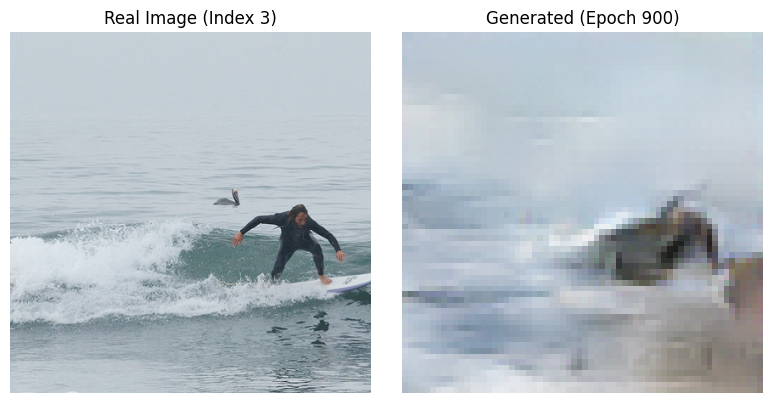

In [ ]:
IMAGE_INDEX = int(input())

TARGET_SUBJECT = 1
TARGET_HEMISPHERE = 'left'
N_COMPONENTS = 256
nz = 100
IMAGE_SIZE = 64
embedding_dim = 128
nc = 3
ngf = 64
fMRI_dim = N_COMPONENTS

PCA_SAVE_DIR_12ROIS = '/content/drive/MyDrive/cdcgan_pca_12rois'
FMRI_LATENT_PATH_12ROIS = os.path.join(PCA_SAVE_DIR_12ROIS, f'fmri_pca_{N_COMPONENTS}.npy')

CHECKPOINT_DIR_12ROIS = '/content/drive/MyDrive/cDCGAN_1000_epochs_2'

CHECKPOINT_EPOCH = 900
GENERATOR_CKPT_PATH = os.path.join(CHECKPOINT_DIR_12ROIS, 'checkpoints', f'netG_epoch_{CHECKPOINT_EPOCH}.pth')


netG_loaded = None
fmri_pca_all = None
real_image_pil = None
generated_image_tensor = None

try:
    print(f"Loading PCA fMRI data from: {FMRI_LATENT_PATH_12ROIS}")
    if not os.path.exists(FMRI_LATENT_PATH_12ROIS):
        raise FileNotFoundError(f"PCA fMRI data not found at {FMRI_LATENT_PATH_12ROIS}.")
    fmri_pca_all = np.load(FMRI_LATENT_PATH_12ROIS)
    num_total_samples = fmri_pca_all.shape[0]
    print(f"Loaded fMRI PCA components shape: {fmri_pca_all.shape}")

    if not (0 <= IMAGE_INDEX < num_total_samples):
        raise ValueError(f"Image index {IMAGE_INDEX} is out of bounds (0-{num_total_samples-1}).")
    print(f"Using sample index: {IMAGE_INDEX}")
    fmri_condition_np = fmri_pca_all[IMAGE_INDEX]
    fmri_condition = torch.from_numpy(fmri_condition_np).float().unsqueeze(0).to(device) # Add batch dim
    print(f"Loading real image for index: {IMAGE_INDEX}")
    real_image_pil = load_image_subject(TARGET_SUBJECT, IMAGE_INDEX, directory=root_dir)
    if real_image_pil is None:
        raise ValueError(f"Failed to load real image for index {IMAGE_INDEX}")

    print(f"Loading Generator checkpoint from epoch {CHECKPOINT_EPOCH}...")
    if not os.path.exists(GENERATOR_CKPT_PATH):
        raise FileNotFoundError(f"Generator checkpoint not found at {GENERATOR_CKPT_PATH}")
    if 'Generator' not in locals():
         raise NameError("Generator class not defined. Please ensure Cell 4 was executed.")

    netG_loaded = Generator().to(device)
    netG_loaded.load_state_dict(torch.load(GENERATOR_CKPT_PATH, map_location=device))
    netG_loaded.eval()
    print("Generator model loaded successfully.")

    print("Generating image...")
    noise = torch.randn(1, nz, device=device)
    with torch.no_grad():
        generated_image_tensor = netG_loaded(noise, fmri_condition).detach().cpu()

    print("\nDisplaying Real vs. Generated Image...")
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))

    axes[0].imshow(real_image_pil)
    axes[0].set_title(f"Real Image (Index {IMAGE_INDEX})")
    axes[0].axis('off')

    img_display = (generated_image_tensor[0] * 0.5 + 0.5).clamp(0, 1)
    axes[1].imshow(np.transpose(img_display.numpy(), (1, 2, 0)))
    axes[1].set_title(f"Generated (Epoch {CHECKPOINT_EPOCH})")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

except FileNotFoundError as e:
    print(f"ERROR: Required file not found. {e}")
except NameError as e:
    print(f"ERROR: A required variable or class is not defined ({e}). Ensure previous cells defining it were run.")
except ValueError as e:
    print(f"ERROR: {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

## FID

In [ ]:
!pip install pytorch-fid

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 100.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 103.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvji

In [ ]:
# --- Example Data Splitting (BEFORE creating dataset/dataloader in Cell 3) ---
from sklearn.model_selection import train_test_split

# Assuming fmri_pca_components (N, 256) and you have indices for real images
num_samples = fmri_pca_components.shape[0]
indices = np.arange(num_samples)

# Split indices
train_indices, test_indices = train_test_split(indices, test_size=0.15, random_state=42) # ~15% test set

# Create PCA components for train/test
fmri_pca_train = fmri_pca_components[train_indices]
fmri_pca_test = fmri_pca_components[test_indices]

# Create the training dataset using fmri_pca_train
# dataset = FMRI_Image_PCA_Dataset(TARGET_SUBJECT, fmri_pca_train, transform=img_transform)
# dataloader = DataLoader(dataset, ...)

# You'll need fmri_pca_test later for generating test images
# Also keep test_indices to load the corresponding real test images
print(f"Data split: {len(train_indices)} train, {len(test_indices)} test samples.")
# --- End Example Data Splitting ---

NameError: name 'fmri_pca_components' is not defined

In [ ]:
# --- Ensure models are loaded and on the correct device ---
# Assuming netG is your trained generator model, already loaded and on device
# e.g., netG.load_state_dict(torch.load(os.path.join(CHECKPOINT_DIR_CDCGAN, 'netG_final.pth')))
# netG.to(device)
netG.eval() # Set to evaluation mode

# --- Directory to save generated images ---
GEN_IMAGES_DIR = os.path.join(OUTPUT_BASE_DIR, 'fid_generated_images')
os.makedirs(GEN_IMAGES_DIR, exist_ok=True)

# --- Convert test fMRI PCA numpy array to tensor ---
fmri_test_tensor = torch.from_numpy(fmri_pca_test).float().to(device)
print(f"Test fMRI PCA tensor shape: {fmri_test_tensor.shape}")

num_test_samples = fmri_test_tensor.shape[0]
gen_batch_size = 64 # Process in batches to avoid OOM

print(f"Generating {num_test_samples} images for FID calculation...")

generated_count = 0
with torch.no_grad(): # No need to track gradients
    for i in tqdm(range(0, num_test_samples, gen_batch_size)):
        # Get batch of fMRI conditions
        fmri_cond_batch = fmri_test_tensor[i : i + gen_batch_size]
        current_b_size = fmri_cond_batch.size(0)

        # Generate noise
        noise = torch.randn(current_b_size, nz, device=device)

        # Generate fake images
        fake_batch = netG(noise, fmri_cond_batch).detach().cpu()

        # Save each image in the batch
        for j in range(fake_batch.size(0)):
            # Unnormalize image from [-1, 1] to [0, 1] then scale to [0, 255] (common for FID tools)
            # OR directly save normalized [0, 1] if your FID tool handles it
            img_tensor = (fake_batch[j] * 0.5 + 0.5).clamp(0, 1) # Unnormalize to [0, 1]

            # Use the original test index for consistent naming if needed
            original_index = test_indices[generated_count]
            vutils.save_image(img_tensor, os.path.join(GEN_IMAGES_DIR, f'fake_{original_index:05d}.png'), normalize=False)
            generated_count += 1

print(f"Finished generating images. Saved {generated_count} images to {GEN_IMAGES_DIR}")

In [ ]:
# --- Directory for real test images ---
REAL_IMAGES_DIR = os.path.join(OUTPUT_BASE_DIR, 'fid_real_images')
os.makedirs(REAL_IMAGES_DIR, exist_ok=True)

print(f"Saving {len(test_indices)} real test images to {REAL_IMAGES_DIR}...")

# Loop through the test indices saved during the split
for idx in tqdm(test_indices, desc="Saving real images"):
    # Load original image using your helper function
    img_pil = load_image_subject(TARGET_SUBJECT, idx, directory=root_dir)

    if img_pil:
        # Save as PNG (or JPG)
        save_path = os.path.join(REAL_IMAGES_DIR, f'real_{idx:05d}.png')
        img_pil.save(save_path)
    else:
        print(f"Warning: Could not load real image for index {idx}. Skipping.")

print("Finished saving real test images.")

In [ ]:
# Calculate FID score
# Ensure the paths point to the directories created in Step 2 and Step 3
!python -m pytorch_fid "{REAL_IMAGES_DIR}" "{GEN_IMAGES_DIR}" --device cuda:0